# Explolatory Data Analysis

## Dataset Overview & Integrity Check

In [1]:
# Sub-Step 1.1
# Tujuan: Setup path dataset dan sanity check folder utama

import os
from pathlib import Path

TRAIN_DIR = Path("/kaggle/input/coffee-bean-classification-dataset/Deteksi Jenis Kopi/train")

assert TRAIN_DIR.exists(), "Train directory tidak ditemukan"

print("Train directory:", TRAIN_DIR)
print("Subfolders (classes):")
for p in TRAIN_DIR.iterdir():
    if p.is_dir():
        print("-", p.name)

Train directory: /kaggle/input/coffee-bean-classification-dataset/Deteksi Jenis Kopi/train
Subfolders (classes):
- defect
- premium
- peaberry
- longberry


In [2]:
# Sub-Step 1.2
# Tujuan: Menentukan label mapping secara eksplisit

class_names = sorted([p.name for p in TRAIN_DIR.iterdir() if p.is_dir()])
class_to_idx = {cls: idx for idx, cls in enumerate(class_names)}

print("Class Names:")
for cls in class_names:
    print(cls)

print("\nClass to Index Mapping:")
class_to_idx

Class Names:
defect
longberry
peaberry
premium

Class to Index Mapping:


{'defect': 0, 'longberry': 1, 'peaberry': 2, 'premium': 3}

In [3]:
# Sub-Step 1.3
# Tujuan: Menghitung jumlah image per kelas

from collections import Counter

image_extensions = (".jpg", ".jpeg", ".png", ".bmp")

image_count = {}

for cls in class_names:
    cls_dir = TRAIN_DIR / cls
    images = [f for f in cls_dir.iterdir() if f.suffix.lower() in image_extensions]
    image_count[cls] = len(images)

image_count

{'defect': 300, 'longberry': 301, 'peaberry': 310, 'premium': 300}

In [4]:
# Sub-Step 1.4
# Tujuan: Menghitung total image dalam dataset train

total_images = sum(image_count.values())

print("Total images in train set:", total_images)

Total images in train set: 1211


In [5]:
# Sub-Step 1.5
# Tujuan: Mengecek apakah ada image corrupt / tidak bisa dibuka

from PIL import Image
from tqdm import tqdm

corrupt_images = []

for cls in class_names:
    cls_dir = TRAIN_DIR / cls
    for img_path in tqdm(cls_dir.iterdir(), desc=f"Checking {cls}"):
        if img_path.suffix.lower() in image_extensions:
            try:
                with Image.open(img_path) as img:
                    img.verify()
            except Exception as e:
                corrupt_images.append({
                    "class": cls,
                    "path": str(img_path),
                    "error": str(e)
                })

print(f"Jumlah image corrupt: {len(corrupt_images)}")

Checking defect: 300it [00:01, 267.91it/s]
Checking longberry: 301it [00:00, 316.19it/s]
Checking peaberry: 310it [00:00, 315.42it/s]
Checking premium: 300it [00:00, 355.71it/s]

Jumlah image corrupt: 0


In [6]:
# Sub-Step 1.6
# Tujuan: Membuat ringkasan hasil STEP 1 dalam bentuk tabel

import pandas as pd

summary_df = pd.DataFrame({
    "class_name": image_count.keys(),
    "num_images": image_count.values()
})

summary_df.loc["TOTAL"] = ["ALL_CLASSES", total_images]

summary_df

,class_name,num_images
0,defect,300
1,longberry,301
2,peaberry,310
3,premium,300
TOTAL,ALL_CLASSES,1211


In [7]:
# Sub-Step 1.7
# Tujuan: Mengekspor hasil STEP 1 ke dalam file PDF

from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt

PDF_PATH = "EDA_STEP_1_Dataset_Overview.pdf"

with PdfPages(PDF_PATH) as pdf:
    
    # --- Page 1: Title ---
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.axis("off")
    ax.text(
        0.5, 0.5,
        "EDA STEP 1\nDataset Overview & Integrity Check\n\nCoffee Bean Classification",
        ha="center", va="center", fontsize=14, weight="bold"
    )
    pdf.savefig(fig, bbox_inches="tight")
    plt.close(fig)
    
    
    # --- Page 2: Dataset Summary Table ---
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.axis("off")
    
    table = ax.table(
        cellText=summary_df.values,
        colLabels=summary_df.columns,
        loc="center",
        cellLoc="center"
    )
    table.scale(1, 1.5)
    
    ax.set_title("Dataset Summary (Train Set)", fontsize=12)
    pdf.savefig(fig, bbox_inches="tight")
    plt.close(fig)
    
    
    # --- Page 3: Integrity Check Summary ---
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.axis("off")
    
    integrity_text = f"""
    TRAIN PATH:
    {TRAIN_DIR}

    Number of Classes:
    {len(class_names)}

    Class Names:
    {', '.join(class_names)}

    Total Images:
    {total_images}

    Corrupt Images Detected:
    {len(corrupt_images)}
    """
    
    ax.text(0.01, 0.99, integrity_text, va="top", fontsize=10)
    ax.set_title("Integrity Check Summary", fontsize=12)
    
    pdf.savefig(fig, bbox_inches="tight")
    plt.close(fig)

print(f"PDF berhasil dibuat: {PDF_PATH}")

PDF berhasil dibuat: EDA_STEP_1_Dataset_Overview.pdf


🧾 Kesimpulan Naratif — EDA STEP 1

Dataset Overview & Integrity Check

Berdasarkan hasil eksplorasi awal pada EDA STEP 1, dataset citra biji kopi yang digunakan menunjukkan kualitas struktural dan integritas data yang sangat baik. Struktur folder dataset bersifat eksplisit dan konsisten, di mana setiap kelas direpresentasikan langsung oleh satu direktori (defect, longberry, peaberry, dan premium). Pola ini memastikan bahwa proses pelabelan bersumber dari struktur data yang jelas dan meminimalkan risiko kesalahan label pada tahap preprocessing maupun data loading.

Dari sisi kuantitas data, dataset terdiri dari total 1.211 citra dengan distribusi yang hampir sepenuhnya seimbang antar kelas. Setiap kelas memiliki sekitar 300 citra, dengan selisih jumlah yang sangat kecil. Kondisi ini merupakan situasi ideal untuk permasalahan klasifikasi multikelas karena tidak menimbulkan bias distribusi kelas pada saat training. Secara teknis, hal ini memungkinkan penggunaan metrik evaluasi standar seperti accuracy dan confusion matrix tanpa perlu penyesuaian khusus seperti class weighting atau resampling pada tahap awal.

Selain itu, pemeriksaan integritas file menunjukkan bahwa tidak ditemukan citra yang rusak atau tidak dapat dibaca. Seluruh gambar dapat diverifikasi dan dibuka dengan baik, sehingga pipeline pelatihan model tidak memerlukan mekanisme defensif tambahan untuk menangani error pembacaan file. Hal ini mengindikasikan bahwa dataset telah melalui proses kurasi dasar yang cukup baik sebelum digunakan.

Secara keseluruhan, EDA STEP 1 menegaskan bahwa dataset berada dalam kondisi siap pakai secara teknis dan tidak memiliki red flag struktural yang dapat menghambat proses modeling. Dengan tidak ditemukannya permasalahan mendasar pada tahap ini, fokus EDA selanjutnya dapat diarahkan ke aspek yang lebih substantif, yaitu karakteristik visual citra, konsistensi label secara visual, serta sinyal pembeda antar kelas yang relevan untuk pembelajaran model CNN. Dengan kata lain, STEP 1 berfungsi sebagai fondasi validasi data yang memastikan bahwa eksperimen selanjutnya dibangun di atas dataset yang stabil dan terpercaya.

## Class Distribution & Imbalance Analysis

In [8]:
# Sub-Step 2.1
# Tujuan: Menghitung ulang jumlah image per kelas (self-contained STEP)

from collections import Counter
from pathlib import Path

TRAIN_DIR = Path("/kaggle/input/coffee-bean-classification-dataset/Deteksi Jenis Kopi/train")
image_extensions = (".jpg", ".jpeg", ".png", ".bmp")

class_counts = {}

for cls_dir in TRAIN_DIR.iterdir():
    if cls_dir.is_dir():
        images = [f for f in cls_dir.iterdir() if f.suffix.lower() in image_extensions]
        class_counts[cls_dir.name] = len(images)

class_counts

{'defect': 300, 'premium': 300, 'peaberry': 310, 'longberry': 301}

In [9]:
# Sub-Step 2.2
# Tujuan: Membuat tabel distribusi kelas & proporsi (%)

import pandas as pd

dist_df = pd.DataFrame(
    list(class_counts.items()),
    columns=["class_name", "num_images"]
)

total_images = dist_df["num_images"].sum()
dist_df["percentage"] = (dist_df["num_images"] / total_images) * 100

dist_df

,class_name,num_images,percentage
0,defect,300,24.772915
1,premium,300,24.772915
2,peaberry,310,25.598679
3,longberry,301,24.855491


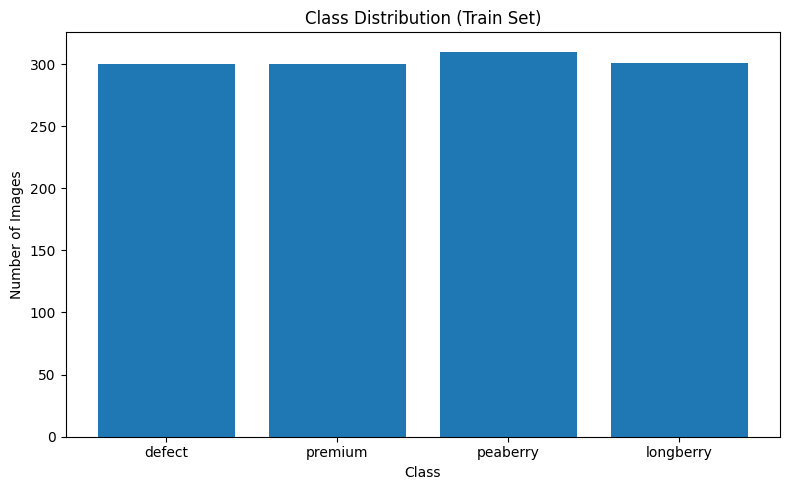

In [10]:
# Sub-Step 2.3
# Tujuan: Visualisasi bar chart distribusi kelas

import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.bar(dist_df["class_name"], dist_df["num_images"])
plt.title("Class Distribution (Train Set)")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

In [11]:
# Sub-Step 2.4
# Tujuan: Menghitung indikator sederhana imbalance

max_count = dist_df["num_images"].max()
min_count = dist_df["num_images"].min()
imbalance_ratio = max_count / min_count

imbalance_summary = {
    "max_images": max_count,
    "min_images": min_count,
    "max_min_ratio": imbalance_ratio
}

imbalance_summary

{'max_images': 310, 'min_images': 300, 'max_min_ratio': 1.0333333333333334}

In [12]:
# Sub-Step 2.5
# Tujuan: Export hasil EDA STEP 2 ke PDF

from matplotlib.backends.backend_pdf import PdfPages

PDF_PATH = "EDA_STEP_2_Class_Distribution.pdf"

with PdfPages(PDF_PATH) as pdf:
    
    # --- Page 1: Title ---
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.axis("off")
    ax.text(
        0.5, 0.5,
        "EDA STEP 2\nClass Distribution & Imbalance Analysis\n\nCoffee Bean Classification",
        ha="center", va="center", fontsize=14, weight="bold"
    )
    pdf.savefig(fig, bbox_inches="tight")
    plt.close(fig)
    
    
    # --- Page 2: Distribution Table ---
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.axis("off")
    
    table = ax.table(
        cellText=dist_df.round(2).values,
        colLabels=dist_df.columns,
        loc="center",
        cellLoc="center"
    )
    table.scale(1, 1.5)
    ax.set_title("Class Distribution Table (Train Set)", fontsize=12)
    
    pdf.savefig(fig, bbox_inches="tight")
    plt.close(fig)
    
    
    # --- Page 3: Bar Chart ---
    fig, ax = plt.subplots(figsize=(8, 5))
    ax.bar(dist_df["class_name"], dist_df["num_images"])
    ax.set_title("Class Distribution Bar Chart")
    ax.set_xlabel("Class")
    ax.set_ylabel("Number of Images")
    
    pdf.savefig(fig, bbox_inches="tight")
    plt.close(fig)
    
    
    # --- Page 4: Imbalance Indicators ---
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.axis("off")
    
    imbalance_text = f"""
    Total Images: {total_images}

    Max Class Size: {max_count}
    Min Class Size: {min_count}

    Max / Min Ratio:
    {imbalance_ratio:.3f}
    """
    
    ax.text(0.01, 0.99, imbalance_text, va="top", fontsize=11)
    ax.set_title("Imbalance Indicators", fontsize=12)
    
    pdf.savefig(fig, bbox_inches="tight")
    plt.close(fig)

print(f"PDF berhasil dibuat: {PDF_PATH}")

PDF berhasil dibuat: EDA_STEP_2_Class_Distribution.pdf


🧾 Kesimpulan Naratif — EDA STEP 2

Hasil EDA STEP 2 menunjukkan bahwa dataset citra biji kopi memiliki distribusi kelas yang sangat seimbang, baik dari sisi jumlah absolut maupun proporsi relatif. Seluruh kelas—termasuk kelas defect—memiliki representasi yang hampir identik, dengan rasio maksimum terhadap minimum yang sangat kecil. Kondisi ini menandakan bahwa dataset tidak menghadapi permasalahan class imbalance yang lazim ditemukan pada tugas inspeksi kualitas atau deteksi cacat.

Dengan tidak ditemukannya ketimpangan kelas yang signifikan, pendekatan modeling dapat difokuskan sepenuhnya pada kemampuan model dalam mengekstraksi fitur visual yang diskriminatif, bukan pada penanganan bias distribusi data. Hal ini juga membuka peluang untuk melakukan evaluasi performa model secara lebih jujur, karena kesalahan klasifikasi pada satu kelas tidak akan tersamarkan oleh dominasi kelas lain.

Namun demikian, keseimbangan kuantitatif ini tidak serta-merta menjamin kemudahan klasifikasi. Masih terdapat kemungkinan bahwa beberapa kelas—khususnya defect—memiliki keragaman visual internal yang lebih tinggi, yang berpotensi meningkatkan kesulitan pembelajaran model. Oleh karena itu, tahap EDA selanjutnya perlu mengkaji konsistensi label secara visual dan perbedaan karakteristik visual antar kelas, guna memastikan bahwa sinyal pembeda antar kelas benar-benar dapat ditangkap oleh model CNN.

## Visual Sanity Check (Human-Level Validation)

In [13]:
# Sub-Step 3.1
# Tujuan: Setup parameter sampling & seed agar reproducible

import random
from pathlib import Path

SEED = 42
SAMPLES_PER_CLASS = 12  # cukup untuk inspeksi visual manusia
random.seed(SEED)

TRAIN_DIR = Path("/kaggle/input/coffee-bean-classification-dataset/Deteksi Jenis Kopi/train")
image_extensions = (".jpg", ".jpeg", ".png", ".bmp")

class_dirs = sorted([p for p in TRAIN_DIR.iterdir() if p.is_dir()])
[class_dir.name for class_dir in class_dirs]

['defect', 'longberry', 'peaberry', 'premium']

In [14]:
# Sub-Step 3.2
# Tujuan: Mengambil sampel acak image per kelas

sampled_images = {}

for cls_dir in class_dirs:
    images = [p for p in cls_dir.iterdir() if p.suffix.lower() in image_extensions]
    sampled = random.sample(images, min(SAMPLES_PER_CLASS, len(images)))
    sampled_images[cls_dir.name] = sampled

{cls: len(imgs) for cls, imgs in sampled_images.items()}

{'defect': 12, 'longberry': 12, 'peaberry': 12, 'premium': 12}

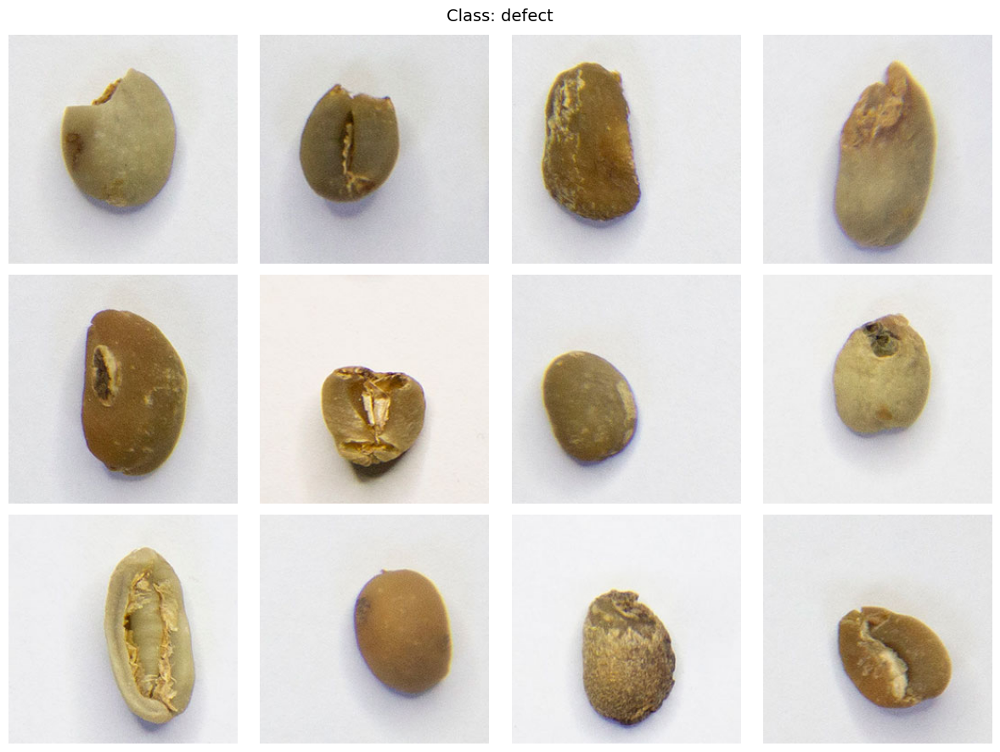

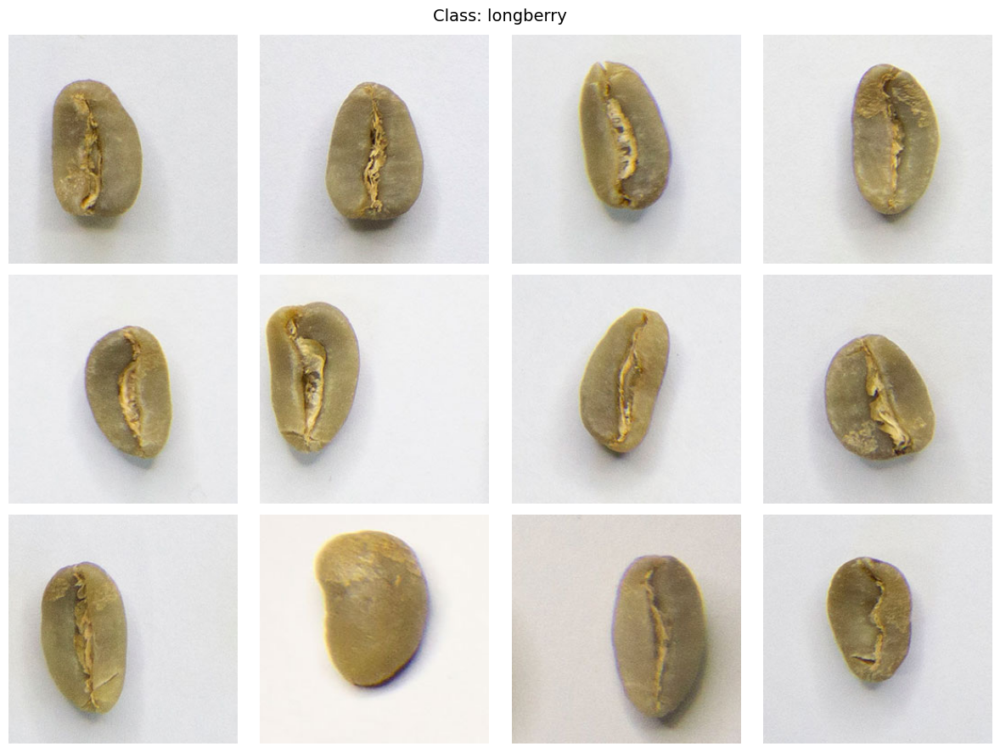

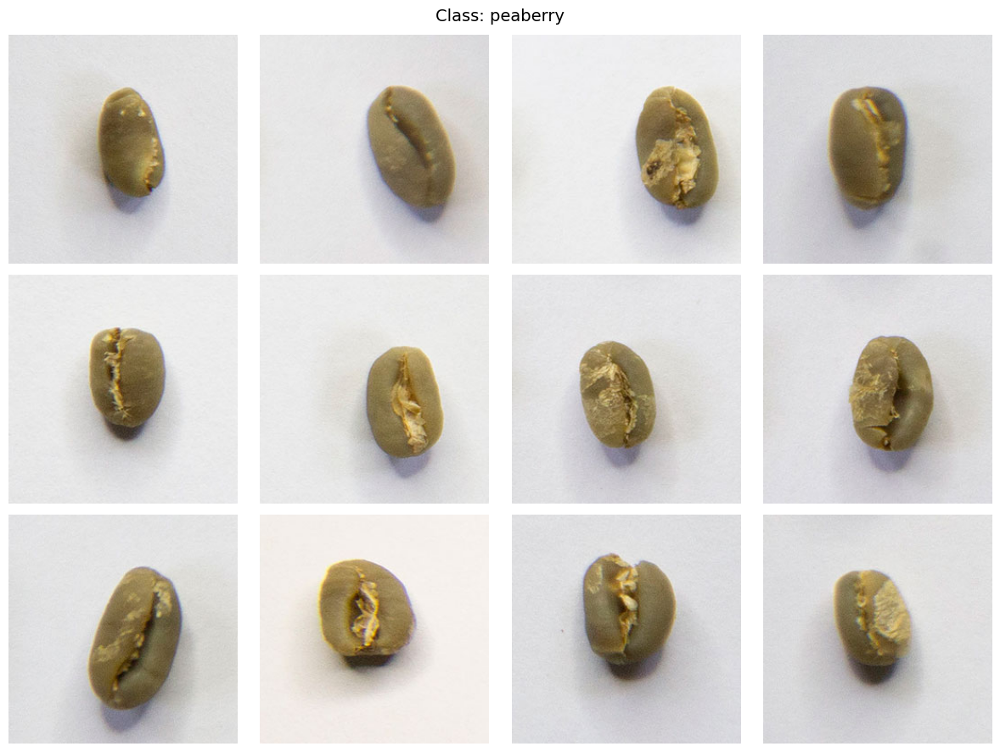

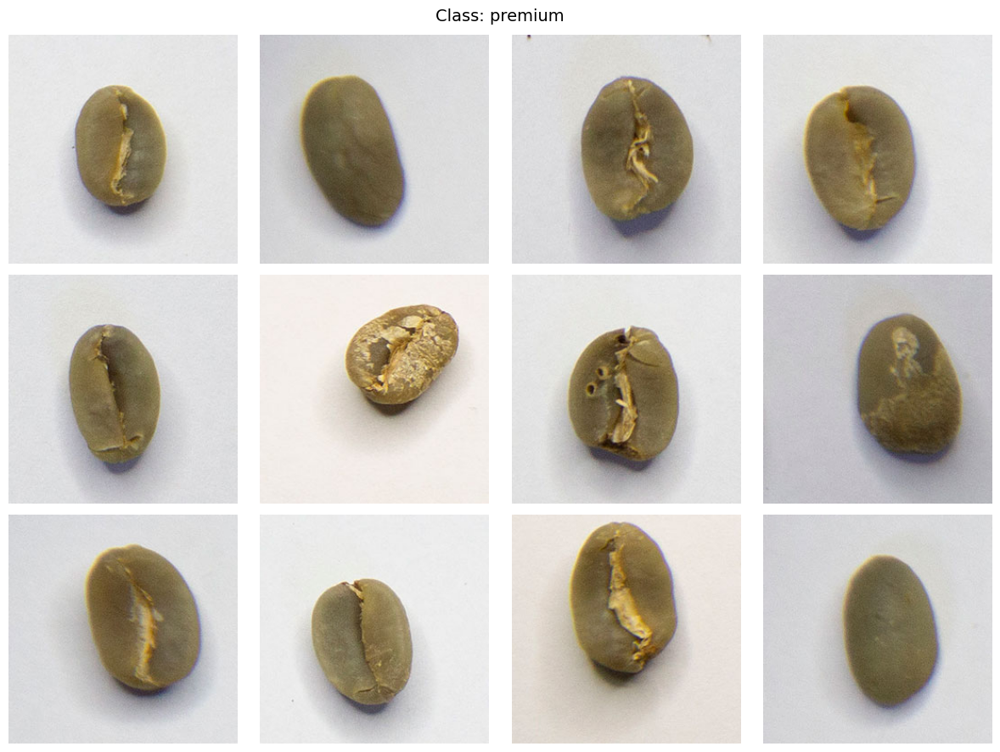

In [15]:
# Sub-Step 3.3
# Tujuan: Menampilkan grid image per kelas untuk visual sanity check

import matplotlib.pyplot as plt
from PIL import Image

def plot_image_grid(image_paths, title, n_cols=4):
    n_images = len(image_paths)
    n_rows = (n_images + n_cols - 1) // n_cols
    
    plt.figure(figsize=(n_cols * 3, n_rows * 3))
    for i, img_path in enumerate(image_paths):
        plt.subplot(n_rows, n_cols, i + 1)
        img = Image.open(img_path)
        plt.imshow(img)
        plt.axis("off")
    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

for cls, imgs in sampled_images.items():
    plot_image_grid(imgs, title=f"Class: {cls}")

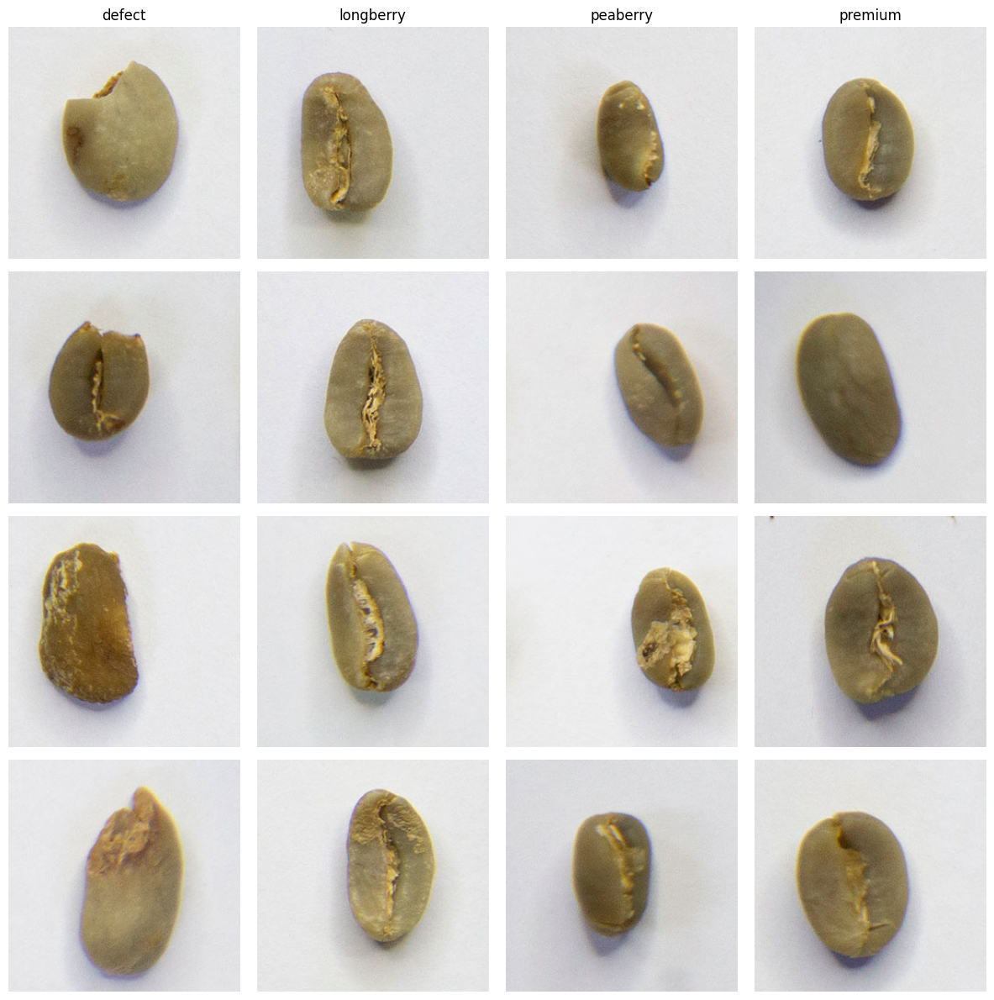

In [16]:
# Sub-Step 3.4
# Tujuan: Perbandingan visual lintas kelas (side-by-side)

def plot_cross_class_comparison(sampled_images, n_samples=5):
    classes = list(sampled_images.keys())
    plt.figure(figsize=(len(classes) * 3, n_samples * 3))
    
    for col, cls in enumerate(classes):
        imgs = sampled_images[cls][:n_samples]
        for row, img_path in enumerate(imgs):
            plt.subplot(n_samples, len(classes), row * len(classes) + col + 1)
            img = Image.open(img_path)
            plt.imshow(img)
            plt.axis("off")
            if row == 0:
                plt.title(cls)
    
    plt.tight_layout()
    plt.show()

plot_cross_class_comparison(sampled_images, n_samples=4)

In [17]:
# Sub-Step 3.5
# Tujuan: Placeholder catatan manual hasil inspeksi visual

manual_notes = {
    "defect": "",
    "longberry": "",
    "peaberry": "",
    "premium": ""
}

manual_notes

{'defect': '', 'longberry': '', 'peaberry': '', 'premium': ''}

In [18]:
# Sub-Step 3.6
# Tujuan: Export hasil EDA STEP 3 ke PDF

from matplotlib.backends.backend_pdf import PdfPages

PDF_PATH = "EDA_STEP_3_Visual_Sanity_Check.pdf"

with PdfPages(PDF_PATH) as pdf:
    
    # --- Page 1: Title ---
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.axis("off")
    ax.text(
        0.5, 0.5,
        "EDA STEP 3\nVisual Sanity Check (Human-Level Validation)\n\nCoffee Bean Classification",
        ha="center", va="center", fontsize=14, weight="bold"
    )
    pdf.savefig(fig, bbox_inches="tight")
    plt.close(fig)
    
    
    # --- Page 2+: Sample grid per class (limited) ---
    for cls, imgs in sampled_images.items():
        fig, ax = plt.subplots(figsize=(8, 6))
        ax.axis("off")
        
        n_show = min(8, len(imgs))
        for i in range(n_show):
            plt.subplot(2, 4, i + 1)
            img = Image.open(imgs[i])
            plt.imshow(img)
            plt.axis("off")
        
        plt.suptitle(f"Class: {cls}", fontsize=12)
        plt.tight_layout()
        pdf.savefig(fig, bbox_inches="tight")
        plt.close(fig)

print(f"PDF berhasil dibuat: {PDF_PATH}")

PDF berhasil dibuat: EDA_STEP_3_Visual_Sanity_Check.pdf


🧾 Kesimpulan Naratif — EDA STEP 3

Hasil EDA STEP 3 menunjukkan bahwa secara visual, dataset biji kopi memiliki karakteristik yang cukup kaya dan menantang untuk klasifikasi berbasis citra. Beberapa kelas seperti longberry dan peaberry memiliki ciri morfologi yang relatif konsisten dan mudah dikenali, sedangkan kelas defect menunjukkan variasi visual yang jauh lebih tinggi. Variasi ini mencerminkan sifat alami cacat biji kopi yang tidak terdefinisi oleh satu pola tunggal, melainkan oleh beragam bentuk ketidaksempurnaan.

Selain itu, inspeksi visual juga mengungkap adanya area abu-abu antara kelas premium dan defect, di mana beberapa biji kopi premium masih menampilkan ketidaksempurnaan ringan. Hal ini mengindikasikan bahwa batas antar kelas tidak sepenuhnya diskrit dan dapat menimbulkan kebingungan bagi model jika tidak ditangani dengan baik. Dengan demikian, tantangan utama pada dataset ini bukan terletak pada ketimpangan jumlah data, melainkan pada overlap visual dan heterogenitas intra-kelas.

Temuan ini menegaskan pentingnya strategi preprocessing dan pemilihan arsitektur model yang mampu menangkap baik informasi bentuk global maupun detail tekstur lokal. STEP 3 berfungsi sebagai jembatan kritis antara validasi data kuantitatif dan desain modeling, serta memberikan dasar kuat untuk menentukan strategi augmentasi, evaluasi per kelas, dan error analysis pada tahap selanjutnya.

## Targeted Visual Stress Test

In [19]:
# Sub-Step 3.5.1
# Tujuan: Mengambil sampel ekstrem (manual heuristic-based)

from PIL import Image
import numpy as np

def image_brightness(img_path):
    img = Image.open(img_path).convert("L")
    return np.array(img).mean()

extreme_samples = {}

for cls_dir in class_dirs:
    images = [p for p in cls_dir.iterdir() if p.suffix.lower() in image_extensions]
    
    scored = [(p, image_brightness(p)) for p in images]
    scored = sorted(scored, key=lambda x: x[1])
    
    extreme_samples[cls_dir.name] = {
        "dark": [p for p, _ in scored[:4]],
        "bright": [p for p, _ in scored[-4:]]
    }

{cls: {k: len(v) for k, v in grp.items()} for cls, grp in extreme_samples.items()}

{'defect': {'dark': 4, 'bright': 4},
 'longberry': {'dark': 4, 'bright': 4},
 'peaberry': {'dark': 4, 'bright': 4},
 'premium': {'dark': 4, 'bright': 4}}

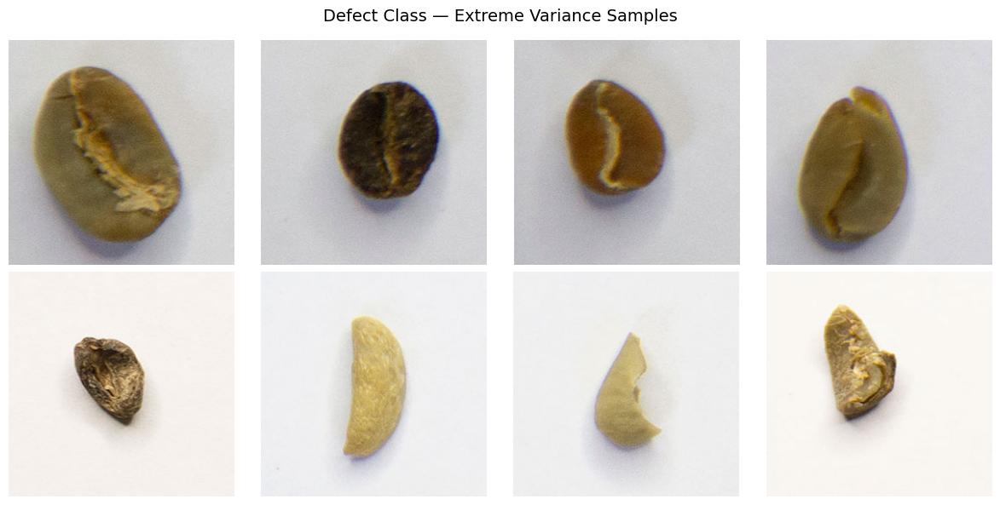

In [20]:
# Sub-Step 3.5.2
# Tujuan: Visualisasi variasi internal kelas defect

defect_imgs = extreme_samples["defect"]["dark"] + extreme_samples["defect"]["bright"]

plot_image_grid(defect_imgs, title="Defect Class — Extreme Variance Samples")

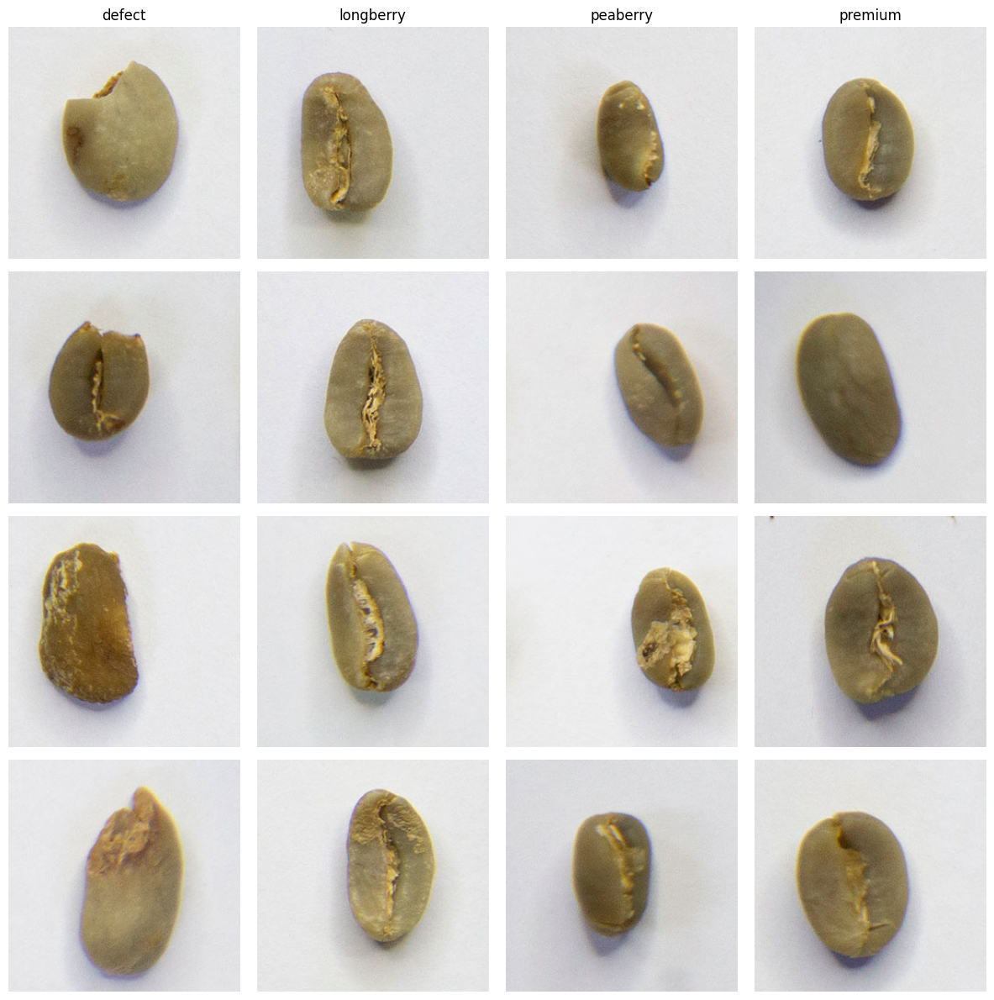

In [21]:
# Sub-Step 3.5.3
# Tujuan: Visualisasi background & lighting antar kelas

bg_samples = {}

for cls, imgs in sampled_images.items():
    bg_samples[cls] = imgs[:4]

plot_cross_class_comparison(bg_samples, n_samples=4)

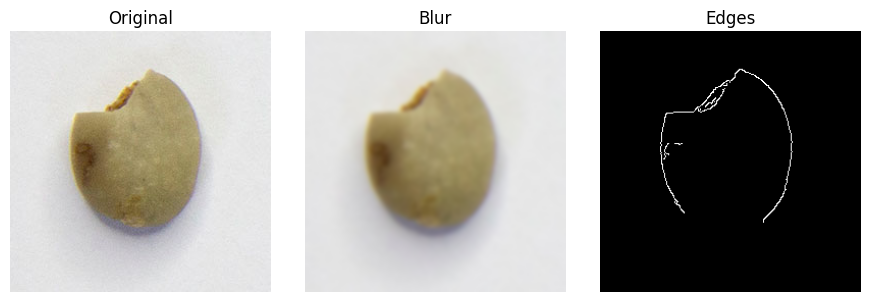

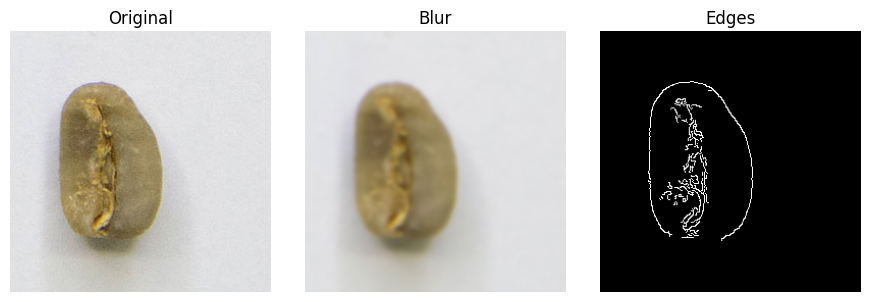

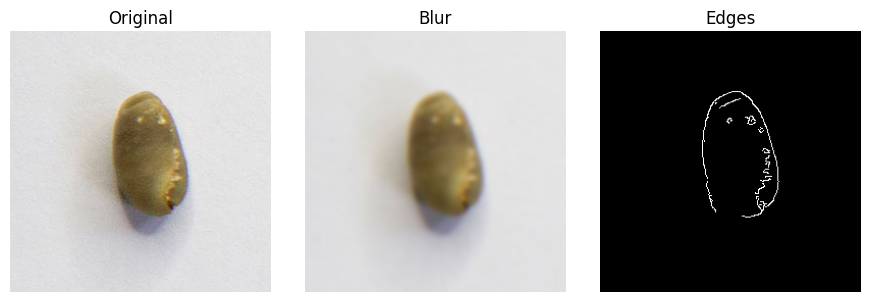

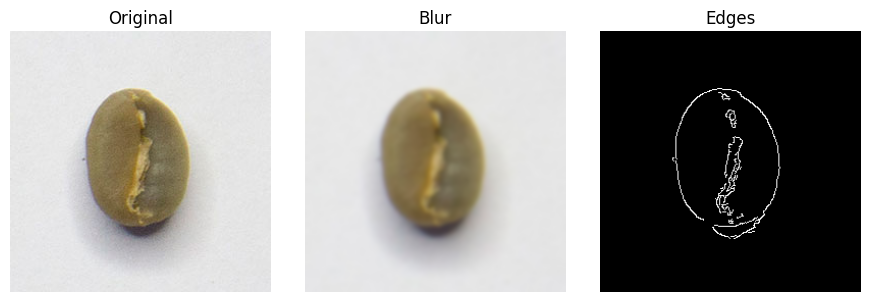

In [22]:
# Sub-Step 3.5.4
# Tujuan: Membandingkan image asli vs blur vs edge

import cv2
import matplotlib.pyplot as plt

def show_shape_texture_test(img_path):
    img = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    blur = cv2.GaussianBlur(img_rgb, (11,11), 0)
    edges = cv2.Canny(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), 100, 200)
    
    plt.figure(figsize=(9,3))
    plt.subplot(1,3,1); plt.imshow(img_rgb); plt.title("Original"); plt.axis("off")
    plt.subplot(1,3,2); plt.imshow(blur); plt.title("Blur"); plt.axis("off")
    plt.subplot(1,3,3); plt.imshow(edges, cmap="gray"); plt.title("Edges"); plt.axis("off")
    plt.tight_layout()
    plt.show()

# contoh 1 image per kelas
for cls in sampled_images:
    show_shape_texture_test(sampled_images[cls][0])

In [23]:
# Sub-Step 3.5.5 (REVISED)
# Tujuan: Export SEMUA output & visualisasi STEP 3.5 ke PDF (COMPLETE)

from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.pyplot as plt
from PIL import Image
import cv2

PDF_PATH = "EDA_STEP_3_5_Targeted_Visual_Stress_Test_FULL.pdf"

with PdfPages(PDF_PATH) as pdf:

    # =========================================================
    # Page 1 — Cover
    # =========================================================
    fig, ax = plt.subplots(figsize=(8, 4))
    ax.axis("off")
    ax.text(
        0.5, 0.5,
        "EDA STEP 3.5\nTargeted Visual Stress Test (FULL)\n\nCoffee Bean Classification",
        ha="center", va="center", fontsize=14, weight="bold"
    )
    pdf.savefig(fig, bbox_inches="tight")
    plt.close(fig)

    # =========================================================
    # Page 2–3 — Extreme Samples (ALL CLASSES)
    # =========================================================
    for cls, groups in extreme_samples.items():
        fig = plt.figure(figsize=(8, 6))
        imgs = groups["dark"] + groups["bright"]
        for i, p in enumerate(imgs):
            plt.subplot(2, 4, i + 1)
            plt.imshow(Image.open(p))
            plt.axis("off")
        plt.suptitle(f"Extreme Samples — Class: {cls}", fontsize=12)
        plt.tight_layout()
        pdf.savefig(fig, bbox_inches="tight")
        plt.close(fig)

    # =========================================================
    # Page — Intra-Class Variance (Defect)
    # =========================================================
    fig = plt.figure(figsize=(8, 6))
    defect_imgs = extreme_samples["defect"]["dark"] + extreme_samples["defect"]["bright"]
    for i, p in enumerate(defect_imgs):
        plt.subplot(2, 4, i + 1)
        plt.imshow(Image.open(p))
        plt.axis("off")
    plt.suptitle("Intra-Class Variance — Defect (Extreme Cases)", fontsize=12)
    plt.tight_layout()
    pdf.savefig(fig, bbox_inches="tight")
    plt.close(fig)

    # =========================================================
    # Page — Background & Lighting Cross-Class
    # =========================================================
    fig = plt.figure(figsize=(8, 6))
    classes = list(sampled_images.keys())
    for col, cls in enumerate(classes):
        imgs = sampled_images[cls][:4]
        for row, p in enumerate(imgs):
            plt.subplot(4, len(classes), row * len(classes) + col + 1)
            plt.imshow(Image.open(p))
            plt.axis("off")
            if row == 0:
                plt.title(cls)
    plt.suptitle("Background & Lighting Consistency (Cross-Class)", fontsize=12)
    plt.tight_layout()
    pdf.savefig(fig, bbox_inches="tight")
    plt.close(fig)

    # =========================================================
    # Page(s) — Shape vs Texture Test (PER CLASS)
    # =========================================================
    for cls, imgs in sampled_images.items():
        p = imgs[0]
        img = cv2.imread(str(p))
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        blur = cv2.GaussianBlur(img_rgb, (11,11), 0)
        edges = cv2.Canny(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), 100, 200)

        fig = plt.figure(figsize=(9, 3))
        plt.subplot(1,3,1); plt.imshow(img_rgb); plt.title("Original"); plt.axis("off")
        plt.subplot(1,3,2); plt.imshow(blur); plt.title("Blur"); plt.axis("off")
        plt.subplot(1,3,3); plt.imshow(edges, cmap="gray"); plt.title("Edges"); plt.axis("off")
        plt.suptitle(f"Shape vs Texture — Class: {cls}", fontsize=12)
        plt.tight_layout()
        pdf.savefig(fig, bbox_inches="tight")
        plt.close(fig)

print(f"PDF LENGKAP berhasil dibuat: {PDF_PATH}")

PDF LENGKAP berhasil dibuat: EDA_STEP_3_5_Targeted_Visual_Stress_Test_FULL.pdf


🧾 KESIMPULAN NARATIF — EDA STEP 3.5

EDA STEP 3.5 memperlihatkan bahwa tantangan utama dalam klasifikasi biji kopi ini tidak terletak pada ketimpangan jumlah data atau kualitas citra secara umum, melainkan pada sifat visual kelas defect yang sangat heterogen dan memiliki batas yang tidak sepenuhnya diskrit terhadap kelas premium. Melalui eksplorasi ekstrem dan stress test visual, terlihat bahwa kelas defect mencakup spektrum cacat yang luas, mulai dari kerusakan ringan hingga bentuk yang sangat tidak normal, sehingga sulit direpresentasikan oleh satu pola visual tunggal.

Eksplorasi ini juga mengonfirmasi bahwa sebagian besar kelas non-defect bersifat shape-dominant, sedangkan defect bersifat texture- dan irregularity-dominant. Perbedaan karakter ini menjadikan permasalahan klasifikasi sebagai masalah hibrida yang menuntut model dengan kemampuan menangkap informasi global dan lokal secara bersamaan. Selain itu, konsistensi background dan pencahayaan yang tinggi, meskipun menguntungkan secara teknis, berpotensi mendorong model untuk mempelajari shortcut visual jika tidak diantisipasi dengan augmentasi yang tepat.

Secara keseluruhan, STEP 3.5 memberikan landasan yang sangat kuat untuk desain preprocessing dan pemilihan arsitektur model. Temuan pada tahap ini secara langsung mengarahkan strategi modeling agar lebih fokus pada generalisasi cacat visual, mitigasi confusion antara defect dan premium, serta penggunaan evaluasi berbasis performa per kelas. Dengan demikian, EDA STEP 3.5 berfungsi sebagai jembatan kritis antara eksplorasi visual dan keputusan teknis dalam pembangunan model klasifikasi yang robust.

## Image Resolution & Aspect Ratio Analysis

In [24]:
# Sub-Step 4.1
# Tujuan: Mengumpulkan metadata resolusi (width, height) seluruh image

from PIL import Image
from pathlib import Path
import pandas as pd

TRAIN_DIR = Path("/kaggle/input/coffee-bean-classification-dataset/Deteksi Jenis Kopi/train")
image_extensions = (".jpg", ".jpeg", ".png", ".bmp")

records = []

for cls_dir in TRAIN_DIR.iterdir():
    if cls_dir.is_dir():
        for img_path in cls_dir.iterdir():
            if img_path.suffix.lower() in image_extensions:
                with Image.open(img_path) as img:
                    width, height = img.size
                records.append({
                    "class_name": cls_dir.name,
                    "width": width,
                    "height": height,
                    "aspect_ratio": width / height
                })

res_df = pd.DataFrame(records)
res_df.head()

,class_name,width,height,aspect_ratio
0,defect,256,256,1.0
1,defect,256,256,1.0
2,defect,256,256,1.0
3,defect,256,256,1.0
4,defect,256,256,1.0


In [25]:
# Sub-Step 4.2
# Tujuan: Statistik resolusi global & per kelas

global_stats = res_df[["width", "height", "aspect_ratio"]].describe()

class_stats = (
    res_df
    .groupby("class_name")[["width", "height", "aspect_ratio"]]
    .describe()
)

global_stats, class_stats

(        width  height  aspect_ratio
 count  1211.0  1211.0        1211.0
 mean    256.0   256.0           1.0
 std       0.0     0.0           0.0
 min     256.0   256.0           1.0
 25%     256.0   256.0           1.0
 50%     256.0   256.0           1.0
 75%     256.0   256.0           1.0
 max     256.0   256.0           1.0,
             width                                                height  \
             count   mean  std    min    25%    50%    75%    max  count   
 class_name                                                                
 defect      300.0  256.0  0.0  256.0  256.0  256.0  256.0  256.0  300.0   
 longberry   301.0  256.0  0.0  256.0  256.0  256.0  256.0  256.0  301.0   
 peaberry    310.0  256.0  0.0  256.0  256.0  256.0  256.0  256.0  310.0   
 premium     300.0  256.0  0.0  256.0  256.0  256.0  256.0  256.0  300.0   
 
                    ...               aspect_ratio                           \
              mean  ...    75%    max        count me

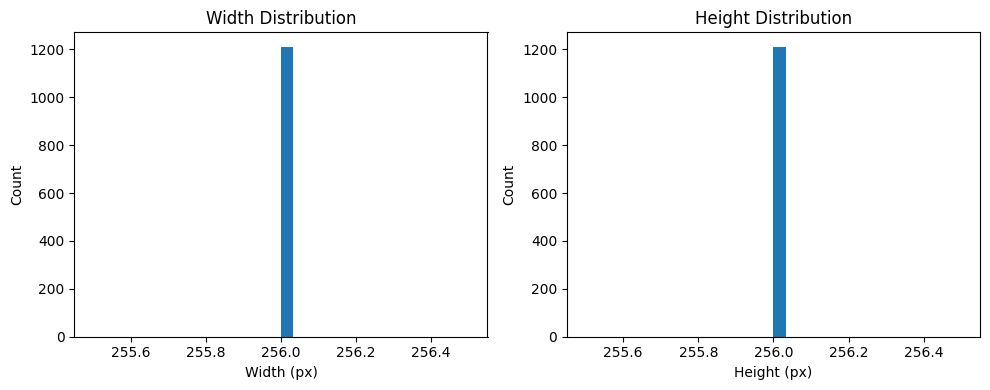

In [26]:
# Sub-Step 4.3
# Tujuan: Histogram distribusi width & height

import matplotlib.pyplot as plt

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.hist(res_df["width"], bins=30)
plt.title("Width Distribution")
plt.xlabel("Width (px)")
plt.ylabel("Count")

plt.subplot(1,2,2)
plt.hist(res_df["height"], bins=30)
plt.title("Height Distribution")
plt.xlabel("Height (px)")
plt.ylabel("Count")

plt.tight_layout()
plt.show()

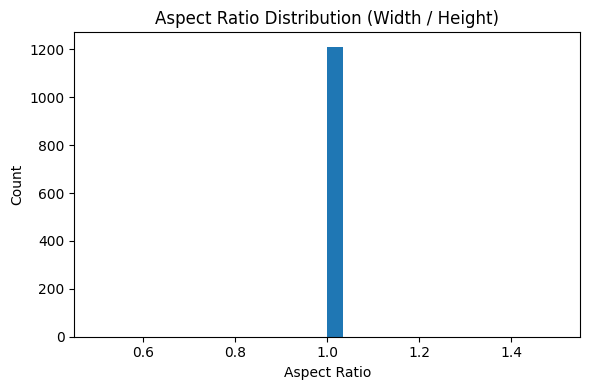

In [27]:
# Sub-Step 4.4
# Tujuan: Distribusi aspect ratio

plt.figure(figsize=(6,4))
plt.hist(res_df["aspect_ratio"], bins=30)
plt.title("Aspect Ratio Distribution (Width / Height)")
plt.xlabel("Aspect Ratio")
plt.ylabel("Count")
plt.tight_layout()
plt.show()

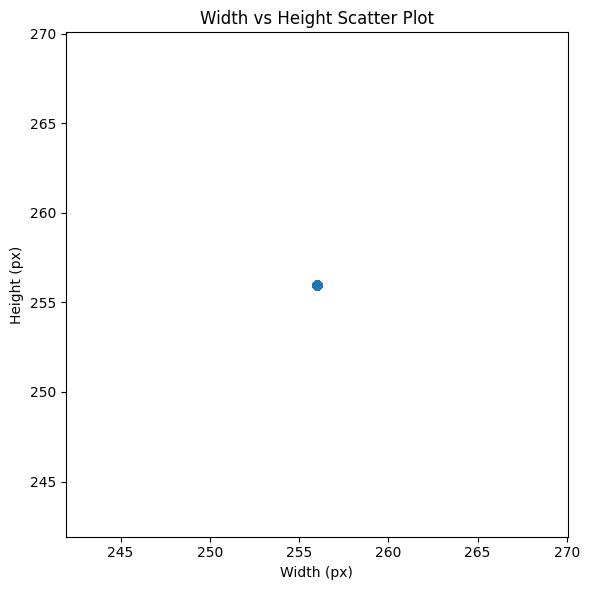

In [28]:
# Sub-Step 4.5
# Tujuan: Scatter plot resolusi (width vs height)

plt.figure(figsize=(6,6))
plt.scatter(res_df["width"], res_df["height"], alpha=0.3)
plt.xlabel("Width (px)")
plt.ylabel("Height (px)")
plt.title("Width vs Height Scatter Plot")
plt.tight_layout()
plt.show()

In [29]:
# Sub-Step 4.6
# Tujuan: Identifikasi image resolusi ekstrem (percentile-based)

low_thresh = res_df[["width", "height"]].quantile(0.01)
high_thresh = res_df[["width", "height"]].quantile(0.99)

extreme_images = res_df[
    (res_df["width"] < low_thresh["width"]) |
    (res_df["height"] < low_thresh["height"]) |
    (res_df["width"] > high_thresh["width"]) |
    (res_df["height"] > high_thresh["height"])
]

extreme_images.head(), len(extreme_images)

(Empty DataFrame
 Columns: [class_name, width, height, aspect_ratio]
 Index: [],
 0)

In [30]:
# Sub-Step 4.7
# Tujuan: Kandidat input size model (berdasarkan statistik)

median_width = int(res_df["width"].median())
median_height = int(res_df["height"].median())

suggested_sizes = {
    "median_based": (median_width, median_height),
    "square_224": (224, 224),
    "square_256": (256, 256)
}

suggested_sizes

{'median_based': (256, 256),
 'square_224': (224, 224),
 'square_256': (256, 256)}

In [31]:
# Sub-Step 4.8
# Tujuan: Export SEMUA output EDA STEP 4 ke PDF

from matplotlib.backends.backend_pdf import PdfPages

PDF_PATH = "EDA_STEP_4_Image_Resolution_Aspect_Ratio.pdf"

with PdfPages(PDF_PATH) as pdf:

    # Cover
    fig, ax = plt.subplots(figsize=(8,4))
    ax.axis("off")
    ax.text(
        0.5, 0.5,
        "EDA STEP 4\nImage Resolution & Aspect Ratio Analysis\n\nCoffee Bean Classification",
        ha="center", va="center", fontsize=14, weight="bold"
    )
    pdf.savefig(fig); plt.close(fig)

    # Global stats table
    fig, ax = plt.subplots(figsize=(8,4))
    ax.axis("off")
    ax.table(
        cellText=global_stats.round(2).values,
        colLabels=global_stats.columns,
        rowLabels=global_stats.index,
        loc="center",
        cellLoc="center"
    )
    ax.set_title("Global Resolution Statistics")
    pdf.savefig(fig); plt.close(fig)

    # Width & Height histograms
    fig = plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.hist(res_df["width"], bins=30)
    plt.title("Width Distribution")
    plt.subplot(1,2,2)
    plt.hist(res_df["height"], bins=30)
    plt.title("Height Distribution")
    plt.tight_layout()
    pdf.savefig(fig); plt.close(fig)

    # Aspect ratio histogram
    fig = plt.figure(figsize=(6,4))
    plt.hist(res_df["aspect_ratio"], bins=30)
    plt.title("Aspect Ratio Distribution")
    plt.tight_layout()
    pdf.savefig(fig); plt.close(fig)

    # Scatter plot
    fig = plt.figure(figsize=(6,6))
    plt.scatter(res_df["width"], res_df["height"], alpha=0.3)
    plt.xlabel("Width")
    plt.ylabel("Height")
    plt.title("Width vs Height")
    plt.tight_layout()
    pdf.savefig(fig); plt.close(fig)

print(f"PDF berhasil dibuat: {PDF_PATH}")

PDF berhasil dibuat: EDA_STEP_4_Image_Resolution_Aspect_Ratio.pdf


🧾 Kesimpulan Naratif — EDA STEP 4

Hasil EDA STEP 4 menunjukkan bahwa seluruh dataset citra biji kopi telah melalui proses standarisasi resolusi yang sempurna, di mana semua gambar memiliki ukuran 256×256 piksel dengan aspect ratio 1:1 tanpa satu pun variasi. Tidak ditemukan perbedaan resolusi antar kelas, tidak ada citra ekstrem berukuran terlalu kecil atau terlalu besar, serta tidak ada risiko distorsi geometris akibat perbedaan proporsi gambar.

Kondisi ini mengindikasikan bahwa dataset bukan merupakan data mentah hasil pengambilan gambar langsung, melainkan data yang telah diproses atau dikurasi sebelumnya dengan tujuan menyeragamkan input visual. Dari sudut pandang machine learning engineer, hal ini sangat menguntungkan karena menghilangkan satu sumber variabilitas penting yang sering menjadi penyebab kegagalan model, yaitu ketidakkonsistenan resolusi dan aspect ratio.

Dengan demikian, tahap penentuan strategi resize tidak lagi bersifat eksploratif, melainkan konfirmatif. Input size model dapat ditetapkan secara langsung tanpa kompromi, dan pipeline preprocessing dapat difokuskan pada aspek lain seperti augmentasi, normalisasi warna, dan regularisasi visual, bukan pada penanganan perbedaan resolusi.

## Color Space & Intensity Distribution

In [32]:
# Sub-Step 5.1
# Tujuan: Load pixel RGB dari seluruh image

import numpy as np
from PIL import Image
from pathlib import Path

TRAIN_DIR = Path("/kaggle/input/coffee-bean-classification-dataset/Deteksi Jenis Kopi/train")
image_extensions = (".jpg", ".jpeg", ".png", ".bmp")

rgb_records = []

for cls_dir in TRAIN_DIR.iterdir():
    if cls_dir.is_dir():
        for img_path in cls_dir.iterdir():
            if img_path.suffix.lower() in image_extensions:
                img = Image.open(img_path).convert("RGB")
                arr = np.array(img)
                rgb_records.append({
                    "class_name": cls_dir.name,
                    "pixels": arr.reshape(-1, 3)
                })

len(rgb_records)

1211

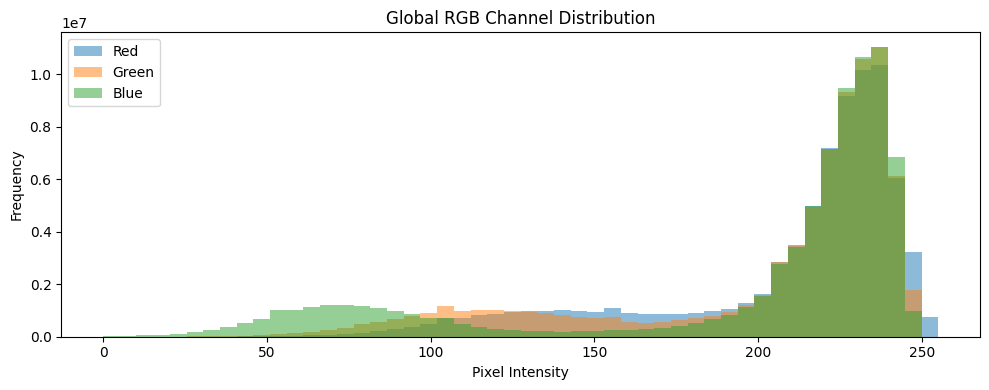

In [33]:
# Sub-Step 5.2
# Tujuan: Histogram global RGB channel

import matplotlib.pyplot as plt

all_pixels = np.vstack([rec["pixels"] for rec in rgb_records])

plt.figure(figsize=(10,4))
plt.hist(all_pixels[:,0], bins=50, alpha=0.5, label="Red")
plt.hist(all_pixels[:,1], bins=50, alpha=0.5, label="Green")
plt.hist(all_pixels[:,2], bins=50, alpha=0.5, label="Blue")
plt.legend()
plt.title("Global RGB Channel Distribution")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

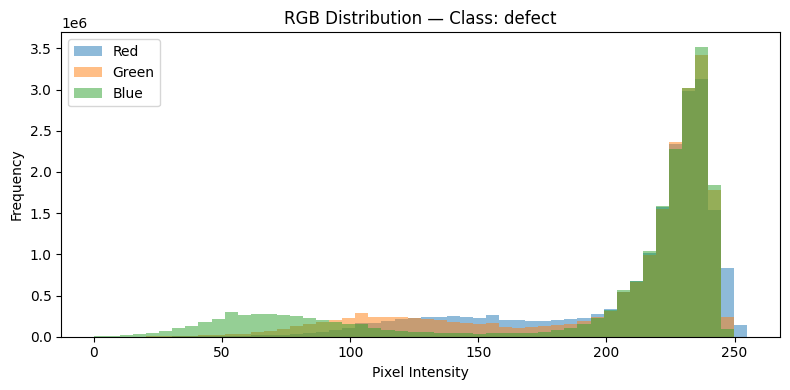

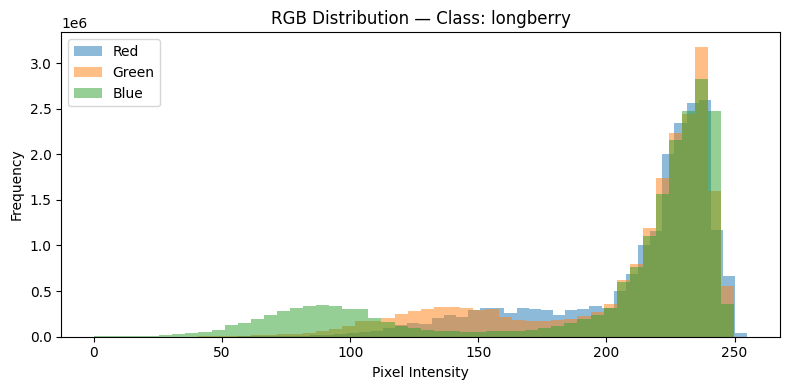

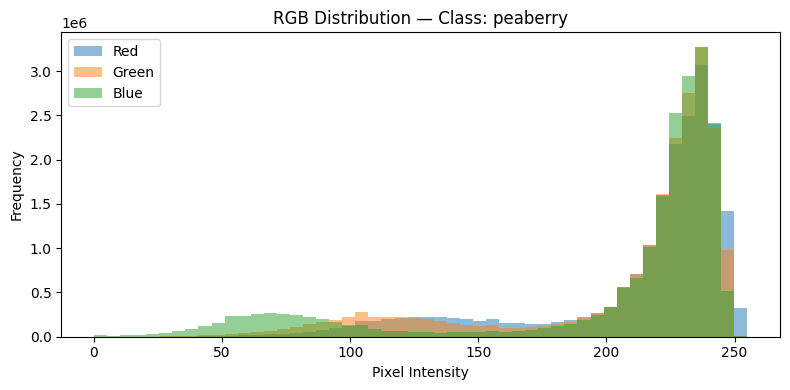

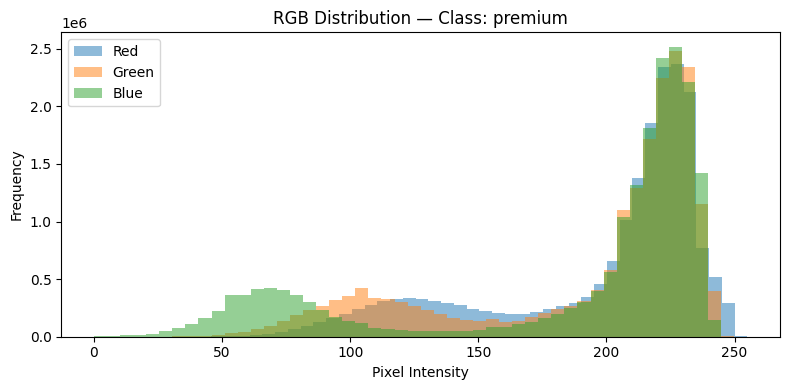

In [34]:
# Sub-Step 5.3
# Tujuan: Histogram RGB per kelas

for cls in sorted(set(r["class_name"] for r in rgb_records)):
    cls_pixels = np.vstack([r["pixels"] for r in rgb_records if r["class_name"] == cls])
    
    plt.figure(figsize=(8,4))
    plt.hist(cls_pixels[:,0], bins=50, alpha=0.5, label="Red")
    plt.hist(cls_pixels[:,1], bins=50, alpha=0.5, label="Green")
    plt.hist(cls_pixels[:,2], bins=50, alpha=0.5, label="Blue")
    plt.legend()
    plt.title(f"RGB Distribution — Class: {cls}")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    plt.tight_layout()
    plt.show()

In [35]:
# Sub-Step 5.4
# Tujuan: Statistik mean & std pixel intensity

stats_records = []

for cls in sorted(set(r["class_name"] for r in rgb_records)):
    cls_pixels = np.vstack([r["pixels"] for r in rgb_records if r["class_name"] == cls])
    stats_records.append({
        "class_name": cls,
        "mean_R": cls_pixels[:,0].mean(),
        "mean_G": cls_pixels[:,1].mean(),
        "mean_B": cls_pixels[:,2].mean(),
        "std_R": cls_pixels[:,0].std(),
        "std_G": cls_pixels[:,1].std(),
        "std_B": cls_pixels[:,2].std(),
    })

import pandas as pd
color_stats_df = pd.DataFrame(stats_records)
color_stats_df

,class_name,mean_R,mean_G,mean_B,std_R,std_G,std_B
0,defect,210.217404,204.842134,196.538412,40.175736,48.013973,63.414497
1,longberry,212.041156,207.177540,198.036868,34.328530,41.169827,58.344502
2,peaberry,212.711993,208.411707,201.738202,40.635467,46.352472,58.969760
3,premium,197.838339,193.077696,185.274529,43.567619,49.416138,63.195856


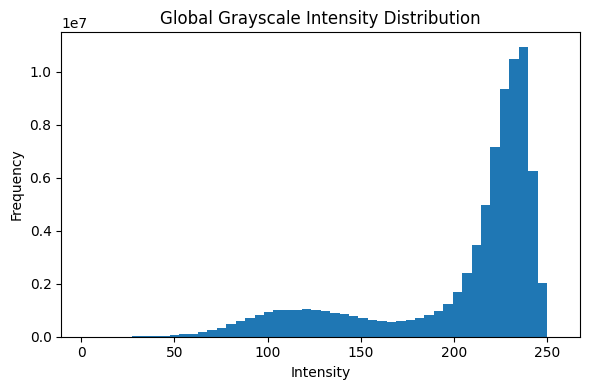

In [36]:
# Sub-Step 5.5
# Tujuan: Distribusi intensitas grayscale

gray_pixels = []

for rec in rgb_records:
    gray = np.dot(rec["pixels"], [0.299, 0.587, 0.114])
    gray_pixels.append(gray)

gray_pixels = np.concatenate(gray_pixels)

plt.figure(figsize=(6,4))
plt.hist(gray_pixels, bins=50)
plt.title("Global Grayscale Intensity Distribution")
plt.xlabel("Intensity")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

In [37]:
# Sub-Step 5.6
# Tujuan: Export SEMUA output EDA STEP 5 ke PDF

from matplotlib.backends.backend_pdf import PdfPages

PDF_PATH = "EDA_STEP_5_Color_Intensity_Distribution.pdf"

with PdfPages(PDF_PATH) as pdf:

    # Cover
    fig, ax = plt.subplots(figsize=(8,4))
    ax.axis("off")
    ax.text(
        0.5, 0.5,
        "EDA STEP 5\nColor Space & Intensity Distribution\n\nCoffee Bean Classification",
        ha="center", va="center", fontsize=14, weight="bold"
    )
    pdf.savefig(fig); plt.close(fig)

    # Global RGB histogram
    fig = plt.figure(figsize=(10,4))
    plt.hist(all_pixels[:,0], bins=50, alpha=0.5, label="Red")
    plt.hist(all_pixels[:,1], bins=50, alpha=0.5, label="Green")
    plt.hist(all_pixels[:,2], bins=50, alpha=0.5, label="Blue")
    plt.legend()
    plt.title("Global RGB Distribution")
    plt.tight_layout()
    pdf.savefig(fig); plt.close(fig)

    # RGB per class
    for cls in color_stats_df["class_name"]:
        cls_pixels = np.vstack([r["pixels"] for r in rgb_records if r["class_name"] == cls])
        fig = plt.figure(figsize=(8,4))
        plt.hist(cls_pixels[:,0], bins=50, alpha=0.5, label="Red")
        plt.hist(cls_pixels[:,1], bins=50, alpha=0.5, label="Green")
        plt.hist(cls_pixels[:,2], bins=50, alpha=0.5, label="Blue")
        plt.legend()
        plt.title(f"RGB Distribution — Class: {cls}")
        plt.tight_layout()
        pdf.savefig(fig); plt.close(fig)

    # Color statistics table
    fig, ax = plt.subplots(figsize=(8,4))
    ax.axis("off")
    ax.table(
        cellText=color_stats_df.round(2).values,
        colLabels=color_stats_df.columns,
        loc="center",
        cellLoc="center"
    )
    ax.set_title("Pixel Intensity Statistics per Class")
    pdf.savefig(fig); plt.close(fig)

    # Grayscale histogram
    fig = plt.figure(figsize=(6,4))
    plt.hist(gray_pixels, bins=50)
    plt.title("Global Grayscale Intensity Distribution")
    plt.tight_layout()
    pdf.savefig(fig); plt.close(fig)

print(f"PDF berhasil dibuat: {PDF_PATH}")

PDF berhasil dibuat: EDA_STEP_5_Color_Intensity_Distribution.pdf


🧾 Kesimpulan Naratif — EDA STEP 5

EDA STEP 5 menunjukkan bahwa karakteristik warna dan intensitas pada dataset biji kopi ini relatif homogen, dengan distribusi RGB yang sangat tumpang tindih baik secara global maupun antar kelas. Dominasi intensitas tinggi pada seluruh channel mencerminkan kondisi pencahayaan yang kuat dan background putih yang konsisten, sehingga warna latar menjadi faktor dominan dalam histogram global. Akibatnya, perbedaan warna antar kelas tidak muncul sebagai sinyal yang kuat dan diskrit, melainkan bersifat halus dan kontinu.

Analisis per kelas serta statistik intensitas mengindikasikan bahwa meskipun terdapat variasi pencahayaan dan perbedaan rata-rata intensitas—terutama pada kelas premium yang sedikit lebih gelap—tingkat overlap antar kelas tetap tinggi. Hal ini menunjukkan bahwa warna bukanlah fitur utama yang dapat diandalkan secara tunggal untuk klasifikasi, melainkan berperan sebagai fitur pendukung yang melengkapi informasi bentuk dan tekstur yang telah teridentifikasi pada EDA visual sebelumnya.

Distribusi grayscale yang serupa antar kelas memperkuat kesimpulan bahwa informasi luminance saja tidak cukup untuk membedakan kelas secara kuat, meskipun masih mengandung struktur visual utama objek. Oleh karena itu, penggunaan input RGB tetap disarankan untuk menjaga sinyal warna halus yang mungkin membantu model, terutama dalam membedakan kasus borderline seperti defect ringan dan premium. Secara keseluruhan, STEP 5 menegaskan bahwa tantangan utama dataset ini tetap berada pada aspek bentuk dan tekstur, sementara warna dan intensitas berperan sebagai sinyal sekunder yang perlu dikelola dengan hati-hati melalui preprocessing dan augmentasi.

## Texture & Visual Complexity Proxy

In [38]:
# Sub-Step 6.1
# Tujuan: Load image dan konversi ke grayscale

import cv2
import numpy as np
from pathlib import Path

TRAIN_DIR = Path("/kaggle/input/coffee-bean-classification-dataset/Deteksi Jenis Kopi/train")
image_extensions = (".jpg", ".jpeg", ".png", ".bmp")

gray_records = []

for cls_dir in TRAIN_DIR.iterdir():
    if cls_dir.is_dir():
        for img_path in cls_dir.iterdir():
            if img_path.suffix.lower() in image_extensions:
                img = cv2.imread(str(img_path))
                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                gray_records.append({
                    "class_name": cls_dir.name,
                    "gray": gray
                })

len(gray_records)

1211

In [39]:
# Sub-Step 6.2
# Tujuan: Deteksi edge menggunakan Canny

edge_records = []

for rec in gray_records:
    edges = cv2.Canny(rec["gray"], threshold1=100, threshold2=200)
    edge_density = edges.mean() / 255  # proporsi edge pixel
    
    edge_records.append({
        "class_name": rec["class_name"],
        "edge_density": edge_density,
        "edges": edges
    })

len(edge_records)

1211

In [40]:
# Sub-Step 6.3
# Tujuan: Statistik edge density per kelas

import pandas as pd

edge_df = pd.DataFrame(edge_records)

edge_stats = (
    edge_df
    .groupby("class_name")["edge_density"]
    .describe()
)

edge_stats

,count,mean,std,min,25%,50%,75%,max
class_name,,,,,,,,
defect,300.0,0.016787,0.009948,0.000000,0.008938,0.013931,0.023369,0.050613
longberry,301.0,0.016706,0.005198,0.004013,0.013077,0.016647,0.019592,0.036240
peaberry,310.0,0.014667,0.005920,0.003647,0.010521,0.013794,0.017471,0.043015
premium,300.0,0.014444,0.007388,0.003922,0.008556,0.012779,0.017517,0.045181


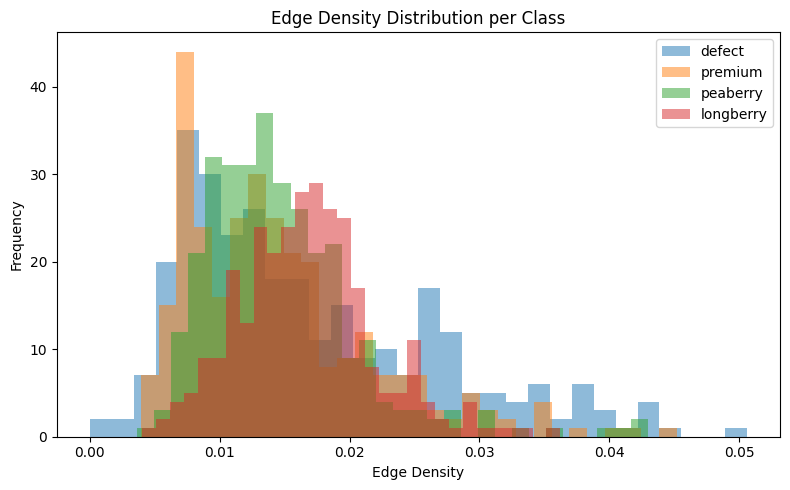

In [41]:
# Sub-Step 6.4
# Tujuan: Histogram edge density per kelas

import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
for cls in edge_df["class_name"].unique():
    plt.hist(
        edge_df[edge_df["class_name"] == cls]["edge_density"],
        bins=30,
        alpha=0.5,
        label=cls
    )

plt.legend()
plt.title("Edge Density Distribution per Class")
plt.xlabel("Edge Density")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

In [42]:
# Sub-Step 6.5
# Tujuan: Menghitung variance pixel grayscale

var_records = []

for rec in gray_records:
    var_records.append({
        "class_name": rec["class_name"],
        "variance": np.var(rec["gray"])
    })

var_df = pd.DataFrame(var_records)

var_stats = var_df.groupby("class_name")["variance"].describe()
var_stats

,count,mean,std,min,25%,50%,75%,max
class_name,,,,,,,,
defect,300.0,2067.211140,690.986245,356.226639,1597.032165,2108.261014,2508.762840,5005.552234
longberry,301.0,1563.956133,278.586454,857.214758,1368.677889,1551.553823,1727.775360,2343.026034
peaberry,310.0,2006.254935,401.140736,861.590550,1713.447222,1996.893871,2275.399426,3064.550699
premium,300.0,2242.452882,405.251539,1286.411164,1955.139896,2191.735751,2513.097174,3486.223523


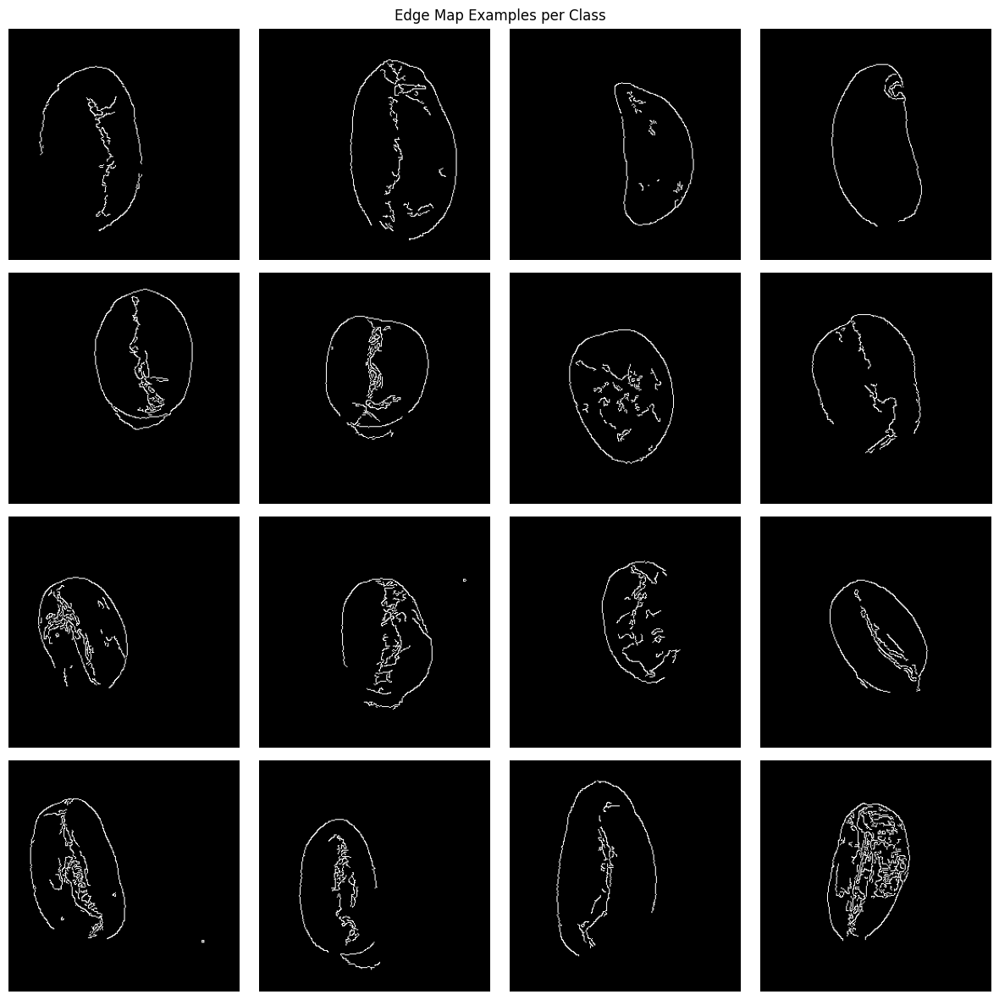

In [43]:
# Sub-Step 6.6
# Tujuan: Visualisasi contoh edge map per kelas

def plot_edge_examples(edge_df, n_samples=4):
    classes = edge_df["class_name"].unique()
    
    plt.figure(figsize=(n_samples*3, len(classes)*3))
    for row, cls in enumerate(classes):
        samples = edge_df[edge_df["class_name"] == cls].sample(n_samples, random_state=42)
        for col, (_, r) in enumerate(samples.iterrows()):
            plt.subplot(len(classes), n_samples, row*n_samples + col + 1)
            plt.imshow(r["edges"], cmap="gray")
            plt.axis("off")
            if col == 0:
                plt.ylabel(cls)
    plt.suptitle("Edge Map Examples per Class")
    plt.tight_layout()
    plt.show()

plot_edge_examples(edge_df)

In [44]:
# Sub-Step 6.7
# Tujuan: Export SEMUA output EDA STEP 6 ke PDF

from matplotlib.backends.backend_pdf import PdfPages

PDF_PATH = "EDA_STEP_6_Texture_Visual_Complexity.pdf"

with PdfPages(PDF_PATH) as pdf:

    # Cover
    fig, ax = plt.subplots(figsize=(8,4))
    ax.axis("off")
    ax.text(
        0.5, 0.5,
        "EDA STEP 6\nTexture & Visual Complexity Proxy\n\nCoffee Bean Classification",
        ha="center", va="center", fontsize=14, weight="bold"
    )
    pdf.savefig(fig); plt.close(fig)

    # Edge density statistics table
    fig, ax = plt.subplots(figsize=(8,4))
    ax.axis("off")
    ax.table(
        cellText=edge_stats.round(4).values,
        colLabels=edge_stats.columns,
        rowLabels=edge_stats.index,
        loc="center",
        cellLoc="center"
    )
    ax.set_title("Edge Density Statistics per Class")
    pdf.savefig(fig); plt.close(fig)

    # Edge density histogram
    fig = plt.figure(figsize=(8,5))
    for cls in edge_df["class_name"].unique():
        plt.hist(
            edge_df[edge_df["class_name"] == cls]["edge_density"],
            bins=30,
            alpha=0.5,
            label=cls
        )
    plt.legend()
    plt.title("Edge Density Distribution per Class")
    plt.tight_layout()
    pdf.savefig(fig); plt.close(fig)

    # Variance statistics table
    fig, ax = plt.subplots(figsize=(8,4))
    ax.axis("off")
    ax.table(
        cellText=var_stats.round(2).values,
        colLabels=var_stats.columns,
        rowLabels=var_stats.index,
        loc="center",
        cellLoc="center"
    )
    ax.set_title("Grayscale Variance Statistics per Class")
    pdf.savefig(fig); plt.close(fig)

    # Edge map examples
    fig = plt.figure(figsize=(10,8))
    classes = edge_df["class_name"].unique()
    n_samples = 4
    for row, cls in enumerate(classes):
        samples = edge_df[edge_df["class_name"] == cls].sample(n_samples, random_state=42)
        for col, (_, r) in enumerate(samples.iterrows()):
            plt.subplot(len(classes), n_samples, row*n_samples + col + 1)
            plt.imshow(r["edges"], cmap="gray")
            plt.axis("off")
            if col == 0:
                plt.ylabel(cls)
    plt.suptitle("Edge Map Examples per Class")
    plt.tight_layout()
    pdf.savefig(fig); plt.close(fig)

print(f"PDF berhasil dibuat: {PDF_PATH}")

PDF berhasil dibuat: EDA_STEP_6_Texture_Visual_Complexity.pdf


🧾 Kesimpulan Naratif — EDA STEP 6

EDA STEP 6 menunjukkan bahwa tekstur dan kompleksitas visual memang berperan dalam membedakan kelas biji kopi, khususnya dalam memahami karakter kelas defect. Namun, metrik tekstur sederhana seperti edge density dan variance grayscale tidak berfungsi sebagai pemisah kelas yang kuat secara kuantitatif karena distribusinya sangat tumpang tindih antar kelas. Perbedaan utama justru muncul pada tingkat variasi dan ekstrem, di mana kelas defect menunjukkan sebaran yang lebih lebar dan nilai maksimum yang lebih tinggi, mencerminkan heterogenitas visual yang telah teridentifikasi pada EDA visual sebelumnya.

Analisis ini juga menegaskan bahwa tekstur kasar tidak selalu identik dengan cacat, sebagaimana terlihat dari kelas premium yang memiliki variance grayscale cukup tinggi. Dengan demikian, tekstur bukan sinyal tunggal yang deterministik, melainkan sinyal pendukung yang bekerja bersama informasi bentuk dan struktur global. Visualisasi edge map memperkuat kesimpulan ini dengan menunjukkan bahwa perbedaan utama terletak pada pola spasial edge, bukan sekadar jumlahnya.

Secara keseluruhan, STEP 6 mengonfirmasi bahwa permasalahan klasifikasi biji kopi ini bersifat kompleks dan tidak dapat diselesaikan dengan satu jenis fitur visual saja. Model yang efektif harus mampu menangkap interaksi antara bentuk global dan tekstur lokal, serta memahami variasi internal yang tinggi pada kelas defect.

## Duplicate & Near-Duplicate Detection (Lightweight)

In [45]:
# Sub-Step 7.1
# Tujuan: Membuat index semua file image (path + class)

from pathlib import Path
import pandas as pd

TRAIN_DIR = Path("/kaggle/input/coffee-bean-classification-dataset/Deteksi Jenis Kopi/train")
image_extensions = (".jpg", ".jpeg", ".png", ".bmp")

rows = []
for cls_dir in TRAIN_DIR.iterdir():
    if cls_dir.is_dir():
        for p in cls_dir.iterdir():
            if p.suffix.lower() in image_extensions:
                rows.append({"class_name": cls_dir.name, "path": str(p)})

files_df = pd.DataFrame(rows)
files_df.head(), len(files_df)

(  class_name                                               path
 0     defect  /kaggle/input/coffee-bean-classification-datas...
 1     defect  /kaggle/input/coffee-bean-classification-datas...
 2     defect  /kaggle/input/coffee-bean-classification-datas...
 3     defect  /kaggle/input/coffee-bean-classification-datas...
 4     defect  /kaggle/input/coffee-bean-classification-datas...,
 1211)

In [46]:
# Sub-Step 7.2
# Tujuan: Install (jika perlu) dan import imagehash

import sys, subprocess

try:
    import imagehash
except ImportError:
    subprocess.check_call([sys.executable, "-m", "pip", "install", "-q", "ImageHash"])
    import imagehash

from PIL import Image
import hashlib

In [47]:
# Sub-Step 7.3
# Tujuan: Hitung MD5 untuk exact-duplicate detection

def md5_file(path, chunk_size=1024 * 1024):
    h = hashlib.md5()
    with open(path, "rb") as f:
        while True:
            chunk = f.read(chunk_size)
            if not chunk:
                break
            h.update(chunk)
    return h.hexdigest()

files_df["md5"] = files_df["path"].apply(md5_file)
files_df[["class_name", "path", "md5"]].head()

,class_name,path,md5
0,defect,/kaggle/input/coffee-bean-classification-datas...,b59488778b366abc53ae6fc4fe71c0df
1,defect,/kaggle/input/coffee-bean-classification-datas...,ad537a448e20b16edf7cac657280039e
2,defect,/kaggle/input/coffee-bean-classification-datas...,8d10ced69c5a51cbaafba5ee4e4adfdf
3,defect,/kaggle/input/coffee-bean-classification-datas...,930569c68bdd3977e3532552524ef2a9
4,defect,/kaggle/input/coffee-bean-classification-datas...,aea9bbc373c1c548fe70a84fe82de43a


In [48]:
# Sub-Step 7.4
# Tujuan: Temukan exact duplicates dan tandai cross-class

md5_groups = (
    files_df.groupby("md5")
    .agg(n=("path", "count"),
         classes=("class_name", lambda x: sorted(set(x))),
         paths=("path", list))
    .reset_index()
)

exact_dups = md5_groups[md5_groups["n"] > 1].copy()
exact_dups["is_cross_class"] = exact_dups["classes"].apply(lambda c: len(c) > 1)

exact_dups[["md5", "n", "classes", "is_cross_class"]].head(), len(exact_dups)

(                                  md5  n      classes  is_cross_class
 15   021ee05197bd916e4f87c466b77e61aa  2   [peaberry]           False
 112  19a6c80d765c98cfba23d11d9f80ad1d  2   [peaberry]           False
 443  5fa064d4a98d38577dc541ce4f4fda23  2   [peaberry]           False
 632  8a4ceab5b21af732db90813f0331bccb  2   [peaberry]           False
 668  90d3ba78c4584befb687ac83cb648d96  2  [longberry]           False,
 11)

In [49]:
# Sub-Step 7.5
# Tujuan: Hitung perceptual hash (pHash) untuk setiap image

def phash_image(path):
    img = Image.open(path).convert("RGB")
    return imagehash.phash(img)  # default 8x8 -> 64-bit hash

files_df["phash"] = files_df["path"].apply(phash_image)
files_df[["class_name", "path", "phash"]].head()

,class_name,path,phash
0,defect,/kaggle/input/coffee-bean-classification-datas...,ee9b9125726c49c9
1,defect,/kaggle/input/coffee-bean-classification-datas...,ecd995379276920c
2,defect,/kaggle/input/coffee-bean-classification-datas...,bec1c12fce3cc831
3,defect,/kaggle/input/coffee-bean-classification-datas...,e7a3986469996665
4,defect,/kaggle/input/coffee-bean-classification-datas...,e1929e6ed9386592


In [50]:
# Sub-Step 7.6
# Tujuan: Group pHash untuk deteksi exact near-duplicate (distance 0)

phash_groups = (
    files_df.groupby(files_df["phash"].astype(str))
    .agg(n=("path", "count"),
         classes=("class_name", lambda x: sorted(set(x))),
         paths=("path", list))
    .reset_index()
    .rename(columns={"phash": "phash_str"})
)

phash_exact_dups = phash_groups[phash_groups["n"] > 1].copy()
phash_exact_dups["is_cross_class"] = phash_exact_dups["classes"].apply(lambda c: len(c) > 1)

phash_exact_dups[["phash_str", "n", "classes", "is_cross_class"]].head(), len(phash_exact_dups)

(            phash_str  n      classes  is_cross_class
 170  b0cfcd3c6433c391  2   [peaberry]           False
 214  b231cbc7cc9c64cc  2   [peaberry]           False
 287  b2cccd263e31ccc3  2   [peaberry]           False
 488  bb39ccc4c3c2e1c3  2  [longberry]           False
 498  bbc3c438c71e3833  2   [peaberry]           False,
 11)

In [51]:
# Sub-Step 7.7
# Tujuan: Cari near-duplicate pairs dengan Hamming distance <= THRESH

import numpy as np

THRESH = 4          # near-duplicate threshold (lebih kecil = lebih ketat)
PREFIX_BITS = 16    # bucketing untuk efisiensi

# convert phash to int64
phash_int = files_df["phash"].apply(lambda h: int(str(h), 16)).astype(np.uint64).values
paths = files_df["path"].values
classes = files_df["class_name"].values

# bucket by prefix
shift = 64 - PREFIX_BITS
bucket_keys = (phash_int >> shift).astype(np.uint64)

buckets = {}
for idx, k in enumerate(bucket_keys):
    buckets.setdefault(int(k), []).append(idx)

near_pairs = []
for k, idxs in buckets.items():
    if len(idxs) < 2:
        continue
    idxs = sorted(idxs)
    for i_pos in range(len(idxs)):
        i = idxs[i_pos]
        hi = int(phash_int[i])
        for j_pos in range(i_pos + 1, len(idxs)):
            j = idxs[j_pos]
            hj = int(phash_int[j])
            dist = (hi ^ hj).bit_count()
            if dist <= THRESH:
                near_pairs.append({
                    "type": "near_duplicate",
                    "hamming_dist": dist,
                    "class_1": classes[i],
                    "class_2": classes[j],
                    "path_1": paths[i],
                    "path_2": paths[j],
                })

near_pairs_df = pd.DataFrame(near_pairs).sort_values(["hamming_dist", "class_1", "class_2"])
near_pairs_df.head(), len(near_pairs_df)

(              type  hamming_dist    class_1    class_2  \
 63  near_duplicate             0  longberry  longberry   
 27  near_duplicate             0   peaberry   peaberry   
 31  near_duplicate             0   peaberry   peaberry   
 36  near_duplicate             0   peaberry   peaberry   
 41  near_duplicate             0   peaberry   peaberry   
 
                                                path_1  \
 63  /kaggle/input/coffee-bean-classification-datas...   
 27  /kaggle/input/coffee-bean-classification-datas...   
 31  /kaggle/input/coffee-bean-classification-datas...   
 36  /kaggle/input/coffee-bean-classification-datas...   
 41  /kaggle/input/coffee-bean-classification-datas...   
 
                                                path_2  
 63  /kaggle/input/coffee-bean-classification-datas...  
 27  /kaggle/input/coffee-bean-classification-datas...  
 31  /kaggle/input/coffee-bean-classification-datas...  
 36  /kaggle/input/coffee-bean-classification-datas...  
 41  /kag

In [52]:
# Sub-Step 7.8
# Tujuan: Buat ringkasan resmi jumlah duplicate dan cross-class risk

summary = {
    "total_images": len(files_df),
    "exact_duplicates_groups_md5": int(len(exact_dups)),
    "exact_duplicates_groups_md5_cross_class": int(exact_dups["is_cross_class"].sum()) if len(exact_dups) else 0,
    "exact_phash_groups": int(len(phash_exact_dups)),
    "exact_phash_groups_cross_class": int(phash_exact_dups["is_cross_class"].sum()) if len(phash_exact_dups) else 0,
    "near_duplicate_pairs_dist_leq_thresh": int(len(near_pairs_df)),
    "near_duplicate_pairs_cross_class": int((near_pairs_df["class_1"] != near_pairs_df["class_2"]).sum()) if len(near_pairs_df) else 0,
    "near_duplicate_thresh": THRESH,
}

summary

{'total_images': 1211,
 'exact_duplicates_groups_md5': 11,
 'exact_duplicates_groups_md5_cross_class': 0,
 'exact_phash_groups': 11,
 'exact_phash_groups_cross_class': 0,
 'near_duplicate_pairs_dist_leq_thresh': 64,
 'near_duplicate_pairs_cross_class': 33,
 'near_duplicate_thresh': 4}

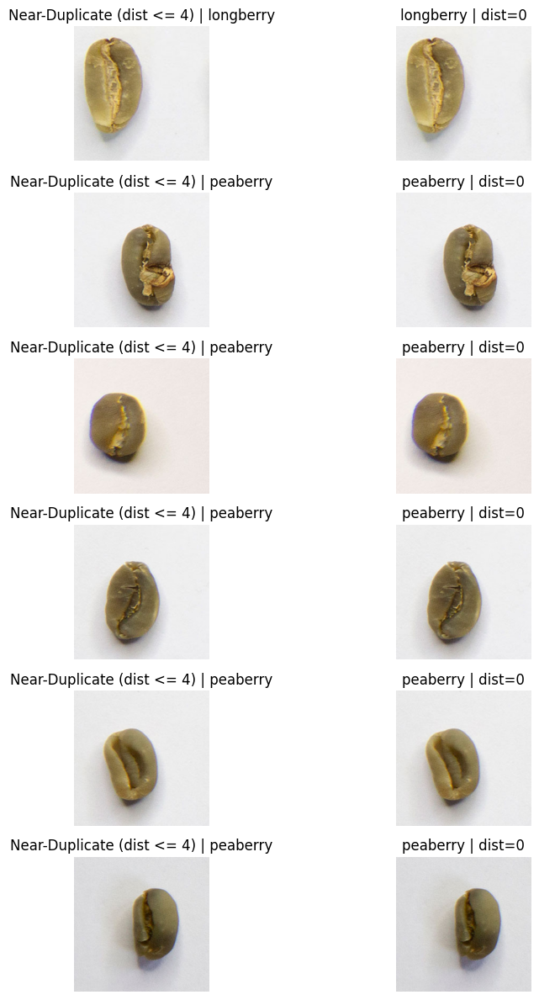

In [53]:
# Sub-Step 7.9
# Tujuan: Visualisasi contoh pasangan duplicate/near-duplicate

import matplotlib.pyplot as plt

def show_pairs(pairs_df, title, n=6):
    if pairs_df is None or len(pairs_df) == 0:
        print(f"[{title}] Tidak ada pasangan untuk divisualisasikan.")
        return
    
    n = min(n, len(pairs_df))
    sample = pairs_df.head(n)
    
    plt.figure(figsize=(10, 2*n))
    for i, (_, r) in enumerate(sample.iterrows()):
        img1 = Image.open(r["path_1"]).convert("RGB")
        img2 = Image.open(r["path_2"]).convert("RGB")
        
        plt.subplot(n, 2, 2*i + 1)
        plt.imshow(img1); plt.axis("off")
        plt.title(f"{title} | {r['class_1']}")
        
        plt.subplot(n, 2, 2*i + 2)
        plt.imshow(img2); plt.axis("off")
        label = f"{r['class_2']}"
        if "hamming_dist" in r:
            label += f" | dist={r['hamming_dist']}"
        plt.title(label)
        plt.axis("off")
    
    plt.tight_layout()
    plt.show()

# ambil contoh dari near-duplicate (jika ada)
show_pairs(near_pairs_df, title=f"Near-Duplicate (dist <= {THRESH})", n=6)

=== Sub-Step 7.9 Revised: Cross-Class Similarity ===
Total cross-class pairs (dist <= 4)      : 33
Cross-class NEAR pairs (1..4)           : 33
Cross-class EXACT conflict pairs (dist==0)     : 0


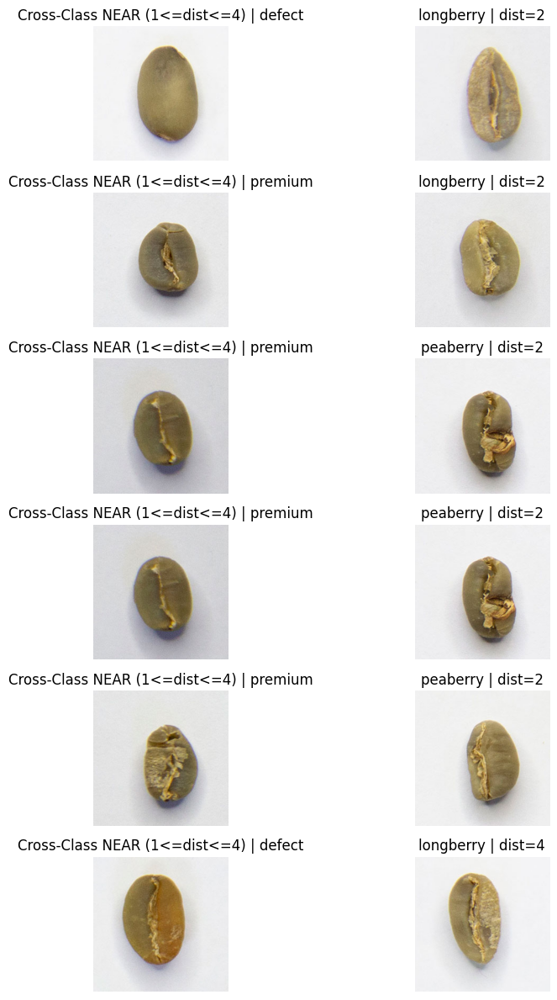

[Cross-Class EXACT CONFLICT (dist=0)] Tidak ada pasangan untuk divisualisasikan.


In [54]:
# Sub-Step 7.9 (REVISED)
# Tujuan: Visualisasi pasangan yang MIRIP tapi LABEL BERBEDA (cross-class ambiguity)
# - Default: cross-class NEAR (0 < dist <= THRESH)
# - Opsional: cross-class EXACT (dist == 0) sebagai label conflict red-flag

import matplotlib.pyplot as plt
from PIL import Image

def show_pairs(pairs_df, title, n=6, sort_by="hamming_dist", random_state=None):
    if pairs_df is None or len(pairs_df) == 0:
        print(f"[{title}] Tidak ada pasangan untuk divisualisasikan.")
        return
    
    # pilih sampel
    if random_state is not None:
        sample = pairs_df.sample(n=min(n, len(pairs_df)), random_state=random_state)
    else:
        if sort_by is not None and sort_by in pairs_df.columns:
            sample = pairs_df.sort_values(sort_by).head(min(n, len(pairs_df)))
        else:
            sample = pairs_df.head(min(n, len(pairs_df)))
    
    plt.figure(figsize=(10, 2 * len(sample)))
    for i, (_, r) in enumerate(sample.iterrows()):
        img1 = Image.open(r["path_1"]).convert("RGB")
        img2 = Image.open(r["path_2"]).convert("RGB")
        
        # kiri
        plt.subplot(len(sample), 2, 2*i + 1)
        plt.imshow(img1); plt.axis("off")
        plt.title(f"{title} | {r['class_1']}")
        
        # kanan
        plt.subplot(len(sample), 2, 2*i + 2)
        plt.imshow(img2); plt.axis("off")
        dist_txt = f"dist={r['hamming_dist']}" if "hamming_dist" in r else ""
        plt.title(f"{r['class_2']} | {dist_txt}")
    
    plt.tight_layout()
    plt.show()


# =========================
# FILTER SESUAI TUJUAN USER
# =========================

# 1) Cross-class pairs: label berbeda
cross_class_pairs_df = near_pairs_df[near_pairs_df["class_1"] != near_pairs_df["class_2"]].copy()

# 2) Cross-class NEAR duplicates (ambiguity beneran): 0 < dist <= THRESH
cross_class_near_df = cross_class_pairs_df[
    cross_class_pairs_df["hamming_dist"].between(1, THRESH)
].copy()

# 3) Cross-class EXACT conflicts (red flag): dist == 0 & label beda
cross_class_exact_conflict_df = cross_class_pairs_df[
    cross_class_pairs_df["hamming_dist"] == 0
].copy()


print("=== Sub-Step 7.9 Revised: Cross-Class Similarity ===")
print(f"Total cross-class pairs (dist <= {THRESH})      : {len(cross_class_pairs_df)}")
print(f"Cross-class NEAR pairs (1..{THRESH})           : {len(cross_class_near_df)}")
print(f"Cross-class EXACT conflict pairs (dist==0)     : {len(cross_class_exact_conflict_df)}")

# =========================
# VISUALISASI (SESUAI TUJUAN)
# =========================

# A) Ini yang kamu maksud: MIRIP tapi LABEL BERBEDA (near, bukan exact)
show_pairs(
    cross_class_near_df,
    title=f"Cross-Class NEAR (1<=dist<={THRESH})",
    n=6,
    sort_by="hamming_dist"
)

# B) Opsional tapi penting: conflict exact (kalau ada)
show_pairs(
    cross_class_exact_conflict_df,
    title="Cross-Class EXACT CONFLICT (dist=0)",
    n=6,
    sort_by="hamming_dist"
)

In [55]:
# Sub-Step 7.10
# Tujuan: Export SEMUA output EDA STEP 7 ke PDF (FULL)

from matplotlib.backends.backend_pdf import PdfPages

PDF_PATH = "EDA_STEP_7_Duplicate_NearDuplicate_Detection.pdf"
TOP_N_TABLE = 30
TOP_N_VIS = 8

with PdfPages(PDF_PATH) as pdf:

    # Cover
    fig, ax = plt.subplots(figsize=(8,4))
    ax.axis("off")
    ax.text(
        0.5, 0.5,
        "EDA STEP 7\nDuplicate & Near-Duplicate Detection (Lightweight)\n\nCoffee Bean Classification",
        ha="center", va="center", fontsize=14, weight="bold"
    )
    pdf.savefig(fig, bbox_inches="tight"); plt.close(fig)

    # Summary page
    fig, ax = plt.subplots(figsize=(8,4))
    ax.axis("off")
    summary_text = "\n".join([f"{k}: {v}" for k, v in summary.items()])
    ax.text(0.02, 0.98, summary_text, va="top", fontsize=11)
    ax.set_title("Summary (Counts & Risk)", fontsize=12)
    pdf.savefig(fig, bbox_inches="tight"); plt.close(fig)

    # Exact duplicates (MD5) table
    fig, ax = plt.subplots(figsize=(8,4))
    ax.axis("off")
    if len(exact_dups) == 0:
        ax.text(0.02, 0.8, "No exact duplicates found (MD5).", fontsize=12)
    else:
        tdf = exact_dups[["md5", "n", "classes", "is_cross_class"]].head(TOP_N_TABLE).copy()
        ax.table(cellText=tdf.values, colLabels=tdf.columns, loc="center", cellLoc="center")
    ax.set_title("Exact Duplicates (MD5) — Top Rows", fontsize=12)
    pdf.savefig(fig, bbox_inches="tight"); plt.close(fig)

    # Exact pHash duplicates table
    fig, ax = plt.subplots(figsize=(8,4))
    ax.axis("off")
    if len(phash_exact_dups) == 0:
        ax.text(0.02, 0.8, "No exact pHash duplicates found (distance=0).", fontsize=12)
    else:
        tdf = phash_exact_dups[["phash_str", "n", "classes", "is_cross_class"]].head(TOP_N_TABLE).copy()
        ax.table(cellText=tdf.values, colLabels=tdf.columns, loc="center", cellLoc="center")
    ax.set_title("Exact Near-Duplicates (pHash distance=0) — Top Rows", fontsize=12)
    pdf.savefig(fig, bbox_inches="tight"); plt.close(fig)

    # Near-duplicate pairs table
    fig, ax = plt.subplots(figsize=(8,4))
    ax.axis("off")
    if len(near_pairs_df) == 0:
        ax.text(0.02, 0.8, f"No near-duplicate pairs found (dist <= {THRESH}).", fontsize=12)
    else:
        tdf = near_pairs_df[["hamming_dist", "class_1", "class_2", "path_1", "path_2"]].head(TOP_N_TABLE).copy()
        ax.table(cellText=tdf.values, colLabels=tdf.columns, loc="center", cellLoc="center")
    ax.set_title(f"Near-Duplicate Pairs (pHash dist <= {THRESH}) — Top Rows", fontsize=12)
    pdf.savefig(fig, bbox_inches="tight"); plt.close(fig)

    # Visual proof pages (near-duplicate)
    if len(near_pairs_df) > 0:
        vis_df = near_pairs_df.head(TOP_N_VIS)
        n = len(vis_df)
        fig = plt.figure(figsize=(10, 2*n))
        for i, (_, r) in enumerate(vis_df.iterrows()):
            img1 = Image.open(r["path_1"]).convert("RGB")
            img2 = Image.open(r["path_2"]).convert("RGB")

            plt.subplot(n, 2, 2*i + 1)
            plt.imshow(img1); plt.axis("off")
            plt.title(f"{r['class_1']} | dist={r['hamming_dist']}")

            plt.subplot(n, 2, 2*i + 2)
            plt.imshow(img2); plt.axis("off")
            plt.title(f"{r['class_2']} | dist={r['hamming_dist']}")

        plt.suptitle(f"Visual Proof — Near-Duplicates (Top {TOP_N_VIS})", fontsize=12)
        plt.tight_layout()
        pdf.savefig(fig, bbox_inches="tight"); plt.close(fig)

print(f"PDF berhasil dibuat: {PDF_PATH}")

PDF berhasil dibuat: EDA_STEP_7_Duplicate_NearDuplicate_Detection.pdf


🧾 Kesimpulan Naratif — EDA STEP 7

EDA STEP 7 mengungkap bahwa meskipun dataset tidak mengandung duplikat gambar yang identik lintas kelas, terdapat sejumlah pasangan citra yang secara perceptual sangat mirip namun memiliki label berbeda. Temuan ini sangat signifikan karena menunjukkan adanya potensi label ambiguity dan risiko data leakage terselubung yang tidak terdeteksi oleh pemeriksaan duplikat konvensional.

Exact duplicates yang ditemukan seluruhnya berada dalam kelas yang sama dan sebagian besar berasal dari kelas peaberry, sehingga tidak menimbulkan risiko kebocoran label secara langsung. Namun, keberadaan near-duplicate lintas kelas dalam jumlah yang cukup besar mengindikasikan bahwa beberapa kelas—terutama defect, premium, dan peaberry—memiliki batas visual yang tidak sepenuhnya jelas. Hal ini berarti bahwa model berpotensi “mengingat” pola visual yang hampir identik selama training dan kemudian diuji pada pola yang secara visual sangat serupa namun memiliki label berbeda, sehingga evaluasi performa dapat menjadi terlalu optimistis atau tidak stabil.

Dengan demikian, STEP 7 tidak hanya berfungsi sebagai pemeriksaan kebersihan data, tetapi juga sebagai konfirmasi kuat bahwa permasalahan klasifikasi biji kopi ini secara inheren memiliki tingkat ambiguitas visual yang tinggi. Temuan ini memperkuat hasil EDA visual dan tekstur sebelumnya, serta menjadi landasan penting untuk strategi preprocessing, splitting data, dan interpretasi hasil model di tahap selanjutnya.

# Preprocessing

## Data Cleaning

In [56]:
# === Exact Duplicate Summary ===

# total group phash yang duplikat
n_phash_groups = len(phash_exact_dups)

# total file yang terlibat dalam duplicate
n_files_in_dups = phash_exact_dups["n"].sum()

# jumlah file berlebih (jika tiap grup hanya simpan 1)
n_redundant_files = (phash_exact_dups["n"] - 1).sum()

# jumlah grup duplicate lintas kelas
n_cross_class_groups = phash_exact_dups["is_cross_class"].sum()

print("=== Exact Duplicate (pHash = 0 distance) ===")
print(f"Jumlah grup pHash duplikat      : {n_phash_groups}")
print(f"Total file dalam grup duplikat : {n_files_in_dups}")
print(f"File redundant (excess)        : {n_redundant_files}")
print(f"Grup lintas kelas (conflict)   : {n_cross_class_groups}")

=== Exact Duplicate (pHash = 0 distance) ===
Jumlah grup pHash duplikat      : 11
Total file dalam grup duplikat : 22
File redundant (excess)        : 11
Grup lintas kelas (conflict)   : 0


In [57]:
# === Near Duplicate Summary ===

# total pasangan near-duplicate
n_near_pairs = len(near_pairs_df)

# pasangan lintas kelas
n_cross_class_pairs = (
    near_pairs_df["class_1"] != near_pairs_df["class_2"]
).sum()

# jumlah file unik yang terlibat dalam near-duplicate
near_dup_files = pd.unique(
    near_pairs_df[["path_1", "path_2"]].values.ravel()
)
n_unique_files_near_dup = len(near_dup_files)

print("=== Near Duplicate / Ambiguity (Hamming <= THRESH) ===")
print(f"Jumlah pasangan near-duplicate     : {n_near_pairs}")
print(f"Pasangan lintas kelas              : {n_cross_class_pairs}")
print(f"File unik terlibat (ambiguous)     : {n_unique_files_near_dup}")

=== Near Duplicate / Ambiguity (Hamming <= THRESH) ===
Jumlah pasangan near-duplicate     : 64
Pasangan lintas kelas              : 33
File unik terlibat (ambiguous)     : 90


In [58]:
# === Overlap Exact vs Near Duplicate ===

exact_dup_files = set(
    sum(phash_exact_dups["paths"].tolist(), [])
)

near_dup_files_set = set(near_dup_files)

overlap_files = exact_dup_files & near_dup_files_set

print("=== Overlap Problem ===")
print(f"File exact dup        : {len(exact_dup_files)}")
print(f"File near dup         : {len(near_dup_files_set)}")
print(f"File overlap keduanya : {len(overlap_files)}")

=== Overlap Problem ===
File exact dup        : 22
File near dup         : 90
File overlap keduanya : 22


In [59]:
print("=== Near Duplicate / Ambiguity Summary (Cross-Class Focus) ===")
print(f"Total pasangan (dist <= {THRESH})              : {len(near_pairs_df)}")

# cross-class = label beda (inti masalah ambiguitas / mislabel)
cross_class_pairs = near_pairs_df[near_pairs_df["class_1"] != near_pairs_df["class_2"]].copy()
print(f"Pasangan lintas kelas (class_1 != class_2)     : {len(cross_class_pairs)}")

# cross-class NEAR (ambiguity beneran): 1..THRESH
cross_class_near_pairs = cross_class_pairs[cross_class_pairs["hamming_dist"].between(1, THRESH)].copy()
print(f"Pasangan cross-class NEAR (1..{THRESH})        : {len(cross_class_near_pairs)}")

# cross-class EXACT conflict (red flag): dist==0 & label beda
cross_class_exact_conflict = cross_class_pairs[cross_class_pairs["hamming_dist"] == 0].copy()
print(f"Pasangan cross-class EXACT conflict (dist=0)   : {len(cross_class_exact_conflict)}")

# file unik yang terlibat dalam cross-class near
cross_near_files = pd.unique(
    cross_class_near_pairs[["path_1", "path_2"]].values.ravel()
) if len(cross_class_near_pairs) > 0 else []

print(f"File unik terlibat (cross-class NEAR)          : {len(cross_near_files)}")

=== Near Duplicate / Ambiguity Summary (Cross-Class Focus) ===
Total pasangan (dist <= 4)              : 64
Pasangan lintas kelas (class_1 != class_2)     : 33
Pasangan cross-class NEAR (1..4)        : 33
Pasangan cross-class EXACT conflict (dist=0)   : 0
File unik terlibat (cross-class NEAR)          : 41


In [60]:
# pilih sample paling mencurigakan sesuai tujuan:
# - prioritas: cross-class NEAR (1..THRESH)
# - fallback: cross-class EXACT conflict (dist=0) kalau near kosong
if len(cross_class_near_pairs) > 0:
    sample_pairs = (
        cross_class_near_pairs
        .sort_values("hamming_dist")
        .head(5)
    )
    sample_title = f"Cross-Class NEAR (1..{THRESH})"
else:
    sample_pairs = (
        cross_class_exact_conflict
        .sort_values("hamming_dist")
        .head(5)
    )
    sample_title = "Cross-Class EXACT Conflict (dist=0)"

display_cols = ["hamming_dist", "class_1", "class_2", "path_1", "path_2"]
sample_pairs[display_cols]

,hamming_dist,class_1,class_2,path_1,path_2
30,2,defect,longberry,/kaggle/input/coffee-bean-classification-datas...,/kaggle/input/coffee-bean-classification-datas...
21,2,premium,longberry,/kaggle/input/coffee-bean-classification-datas...,/kaggle/input/coffee-bean-classification-datas...
12,2,premium,peaberry,/kaggle/input/coffee-bean-classification-datas...,/kaggle/input/coffee-bean-classification-datas...
13,2,premium,peaberry,/kaggle/input/coffee-bean-classification-datas...,/kaggle/input/coffee-bean-classification-datas...
18,2,premium,peaberry,/kaggle/input/coffee-bean-classification-datas...,/kaggle/input/coffee-bean-classification-datas...


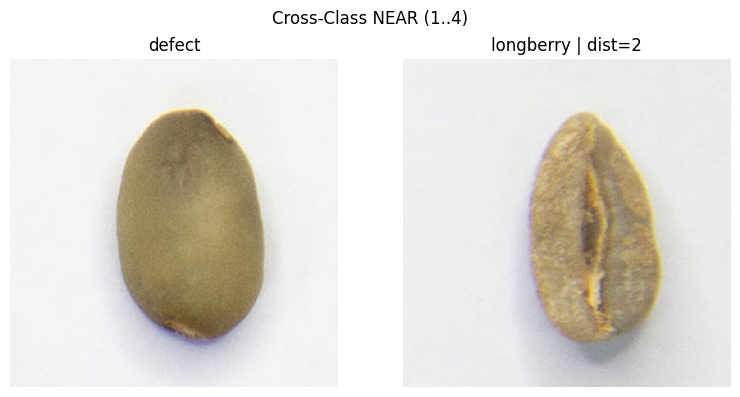

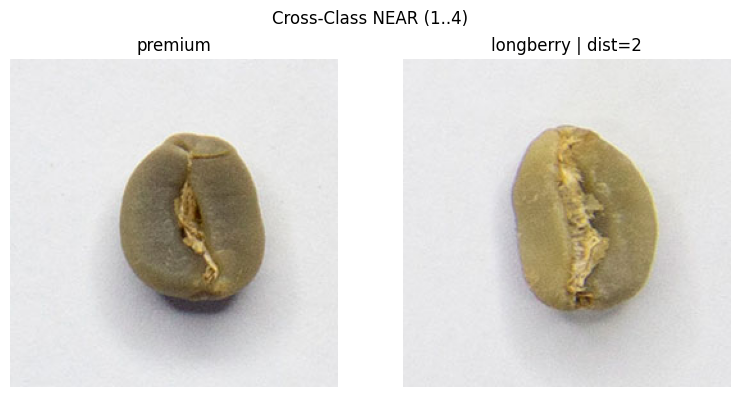

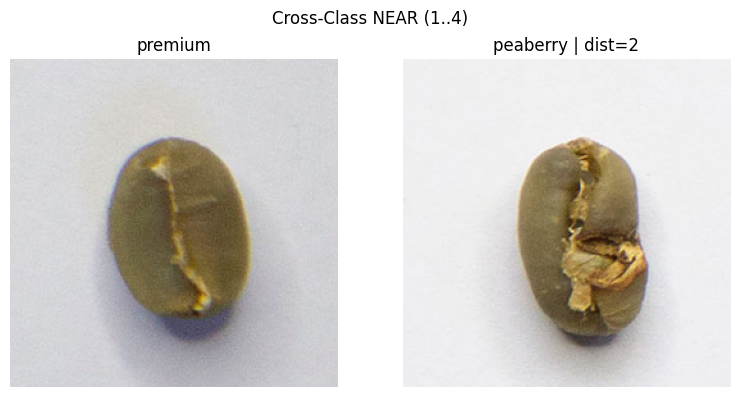

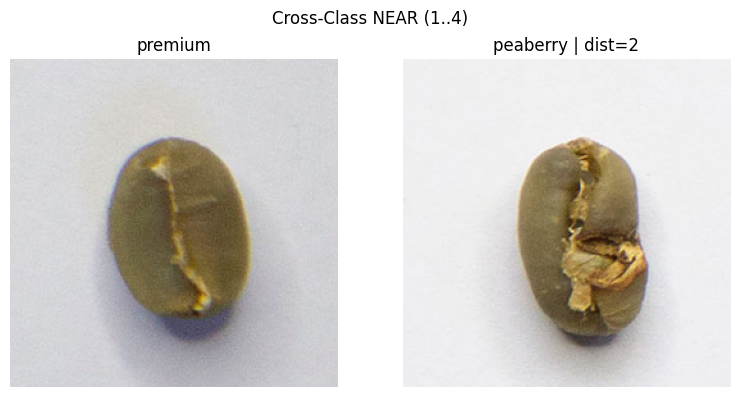

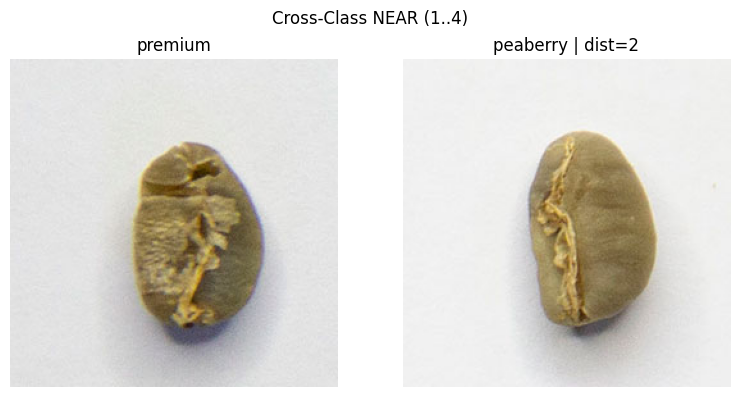

In [61]:
from PIL import Image
import matplotlib.pyplot as plt

def show_cross_class_pairs(df, title, n_pairs=5):
    if df is None or len(df) == 0:
        print(f"[{title}] Tidak ada pasangan untuk divisualisasikan.")
        return

    n_pairs = min(n_pairs, len(df))
    for _, row in df.head(n_pairs).iterrows():
        try:
            img1 = Image.open(row["path_1"]).convert("RGB")
            img2 = Image.open(row["path_2"]).convert("RGB")
        except Exception as e:
            print(f"Gagal membuka salah satu gambar: {e}")
            continue

        fig, axs = plt.subplots(1, 2, figsize=(8, 4))

        axs[0].imshow(img1)
        axs[0].set_title(f"{row['class_1']}")
        axs[0].axis("off")

        axs[1].imshow(img2)
        axs[1].set_title(f"{row['class_2']} | dist={row['hamming_dist']}")
        axs[1].axis("off")

        fig.suptitle(title, fontsize=12)
        plt.tight_layout()
        plt.show()

# tampilkan contoh sesuai tujuan (cross-class)
show_cross_class_pairs(sample_pairs, title=sample_title, n_pairs=5)

In [62]:
# =========================
# 0) Baseline distribusi asli
# =========================
base_dist = files_df["class_name"].value_counts().to_frame("count")
base_dist["pct"] = (base_dist["count"] / base_dist["count"].sum() * 100).round(2)
print("=== Baseline Class Distribution (ALL DATA) ===")
display(base_dist)

=== Baseline Class Distribution (ALL DATA) ===


,count,pct
class_name,,
peaberry,310,25.60
longberry,301,24.86
premium,300,24.77
defect,300,24.77


In [63]:
# =========================
# 1) Definisikan SET file yang bermasalah
# =========================

# --- (1a) Exact duplicates: semua file yang berada dalam grup pHash duplikat
exact_dup_all_files = set(sum(phash_exact_dups["paths"].tolist(), []))  # semua anggota grup

# --- (1b) Exact duplicates: hanya file redundant (simpan 1 per grup)
# Ambil semua path kecuali 1 pertama (representatif) per grup
exact_dup_redundant_files = set()
for paths in phash_exact_dups["paths"].tolist():
    if len(paths) > 1:
        exact_dup_redundant_files.update(paths[1:])  # buang sisanya, simpan paths[0]

# --- (1c) Cross-class similarity (label beda) dari near_pairs_df (dist <= THRESH)
cross_class_pairs = near_pairs_df[near_pairs_df["class_1"] != near_pairs_df["class_2"]].copy()

cross_class_files = set(pd.unique(
    cross_class_pairs[["path_1", "path_2"]].values.ravel()
))

In [64]:
# =========================
# 2) Scenario A (STRICT): exclude semua file yg terlibat exact dup + cross-class similarity
# =========================
exclude_A = exact_dup_all_files.union(cross_class_files)

train_A_df = files_df[~files_df["path"].isin(exclude_A)].copy()

dist_A = train_A_df["class_name"].value_counts().to_frame("count")
dist_A["pct"] = (dist_A["count"] / dist_A["count"].sum() * 100).round(2)

print("\n=== Scenario A (STRICT) ===")
print(f"Excluded files: {len(exclude_A)} / {len(files_df)}  ({len(exclude_A)/len(files_df)*100:.2f}%)")
print(f"Remaining     : {len(train_A_df)}")
display(dist_A)


=== Scenario A (STRICT) ===
Excluded files: 61 / 1211  (5.04%)
Remaining     : 1150


,count,pct
class_name,,
defect,291,25.30
premium,289,25.13
longberry,288,25.04
peaberry,282,24.52


In [65]:
# =========================
# 3) Scenario B (LESS STRICT exact dup): exclude hanya redundant exact dup + cross-class similarity
# =========================
exclude_B = exact_dup_redundant_files.union(cross_class_files)

train_B_df = files_df[~files_df["path"].isin(exclude_B)].copy()

dist_B = train_B_df["class_name"].value_counts().to_frame("count")
dist_B["pct"] = (dist_B["count"] / dist_B["count"].sum() * 100).round(2)

print("\n=== Scenario B (Keep 1 per exact-dup group) ===")
print(f"Excluded files: {len(exclude_B)} / {len(files_df)}  ({len(exclude_B)/len(files_df)*100:.2f}%)")
print(f"Remaining     : {len(train_B_df)}")
display(dist_B)


=== Scenario B (Keep 1 per exact-dup group) ===
Excluded files: 51 / 1211  (4.21%)
Remaining     : 1160


,count,pct
class_name,,
defect,291,25.09
peaberry,291,25.09
premium,289,24.91
longberry,289,24.91


In [66]:
# =========================
# 4) (Opsional) gabungkan agar gampang dibandingkan
# =========================
compare = (
    base_dist.rename(columns={"count":"base_count","pct":"base_pct"})
    .join(dist_A.rename(columns={"count":"A_count","pct":"A_pct"}), how="outer")
    .join(dist_B.rename(columns={"count":"B_count","pct":"B_pct"}), how="outer")
    .fillna(0)
)

compare[["base_count","base_pct","A_count","A_pct","B_count","B_pct"]] = compare[
    ["base_count","base_pct","A_count","A_pct","B_count","B_pct"]
].astype(float)

print("\n=== Comparison Table (Base vs Scenario A vs Scenario B) ===")
display(compare)


=== Comparison Table (Base vs Scenario A vs Scenario B) ===


,base_count,base_pct,A_count,A_pct,B_count,B_pct
class_name,,,,,,
defect,300.0,24.77,291.0,25.30,291.0,25.09
longberry,301.0,24.86,288.0,25.04,289.0,24.91
peaberry,310.0,25.60,282.0,24.52,291.0,25.09
premium,300.0,24.77,289.0,25.13,289.0,24.91


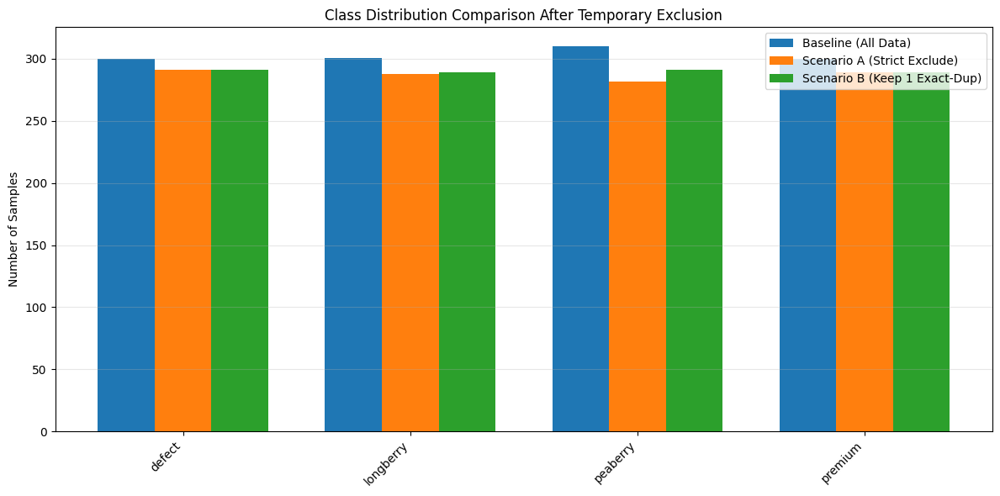

In [67]:
import matplotlib.pyplot as plt
import numpy as np

# pastikan urutan kelas konsisten
classes = compare.index.tolist()
x = np.arange(len(classes))
width = 0.25

# ambil nilai count
base_counts = compare["base_count"].values
A_counts = compare["A_count"].values
B_counts = compare["B_count"].values

plt.figure(figsize=(12, 6))

plt.bar(x - width, base_counts, width, label="Baseline (All Data)")
plt.bar(x,         A_counts,    width, label="Scenario A (Strict Exclude)")
plt.bar(x + width, B_counts,    width, label="Scenario B (Keep 1 Exact-Dup)")

plt.xticks(x, classes, rotation=45, ha="right")
plt.ylabel("Number of Samples")
plt.title("Class Distribution Comparison After Temporary Exclusion")
plt.legend()
plt.grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()

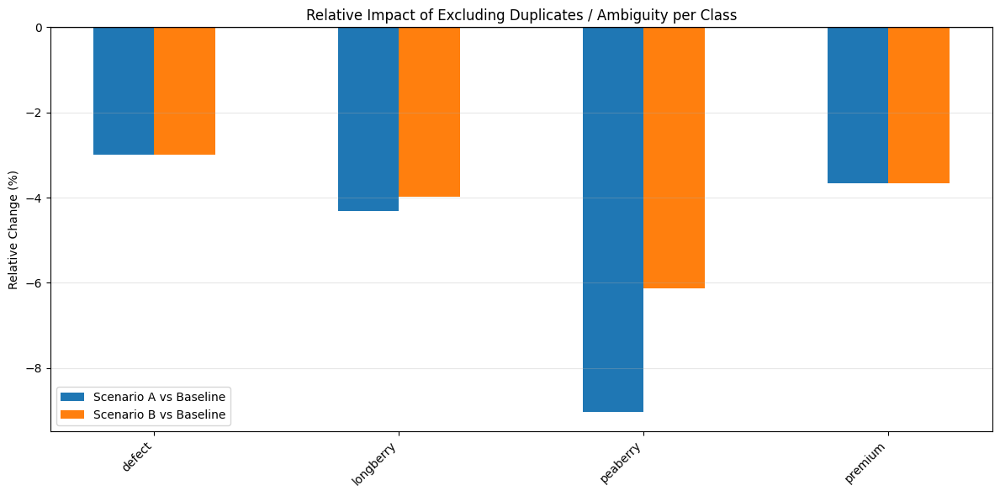

In [68]:
# hitung persentase perubahan relatif terhadap baseline
delta_A = (compare["A_count"] - compare["base_count"]) / compare["base_count"] * 100
delta_B = (compare["B_count"] - compare["base_count"]) / compare["base_count"] * 100

plt.figure(figsize=(12, 6))

plt.bar(x - width/2, delta_A, width, label="Scenario A vs Baseline")
plt.bar(x + width/2, delta_B, width, label="Scenario B vs Baseline")

plt.axhline(0, color="black", linewidth=1)
plt.xticks(x, classes, rotation=45, ha="right")
plt.ylabel("Relative Change (%)")
plt.title("Relative Impact of Excluding Duplicates / Ambiguity per Class")
plt.legend()
plt.grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()

In [69]:
import os
import pandas as pd

# --- Scenario A exclusion set ---
exact_dup_all_files = set(sum(phash_exact_dups["paths"].tolist(), []))

cross_class_pairs = near_pairs_df[near_pairs_df["class_1"] != near_pairs_df["class_2"]].copy()
cross_class_files = set(pd.unique(cross_class_pairs[["path_1", "path_2"]].values.ravel()))

exclude_A = exact_dup_all_files.union(cross_class_files)

# --- hasil: dataframe bersih untuk training ---
train_A_df = files_df[~files_df["path"].isin(exclude_A)].copy()

# --- (opsional) simpan flag di dataframe asli tanpa mengubah data sumber di disk ---
files_df_with_flags = files_df.copy()
files_df_with_flags["exclude_scnA"] = files_df_with_flags["path"].isin(exclude_A)
files_df_with_flags["reason_scnA"] = "keep"
files_df_with_flags.loc[files_df_with_flags["path"].isin(exact_dup_all_files), "reason_scnA"] = "exact_duplicate"
files_df_with_flags.loc[files_df_with_flags["path"].isin(cross_class_files), "reason_scnA"] = "cross_class_similarity"

print("=== Scenario A Result ===")
print(f"Total data awal        : {len(files_df)}")
print(f"Excluded (Scenario A)  : {len(exclude_A)}")
print(f"Remaining for training : {len(train_A_df)}")

=== Scenario A Result ===
Total data awal        : 1211
Excluded (Scenario A)  : 61
Remaining for training : 1150


In [70]:
OUT_DIR = "./preprocessing_outputs/scenario_A"
os.makedirs(OUT_DIR, exist_ok=True)

train_csv_path = os.path.join(OUT_DIR, "train_A_df.csv")
flag_csv_path  = os.path.join(OUT_DIR, "files_df_with_scnA_flags.csv")

train_A_df.to_csv(train_csv_path, index=False)
files_df_with_flags.to_csv(flag_csv_path, index=False)

print("Saved:")
print(" -", train_csv_path)
print(" -", flag_csv_path)

Saved:
 - ./preprocessing_outputs/scenario_A/train_A_df.csv
 - ./preprocessing_outputs/scenario_A/files_df_with_scnA_flags.csv


In [71]:
import shutil
from tqdm import tqdm

TRAIN_FOLDER = os.path.join(OUT_DIR, "train_images")
os.makedirs(TRAIN_FOLDER, exist_ok=True)

# buat subfolder per class
for c in sorted(train_A_df["class_name"].unique()):
    os.makedirs(os.path.join(TRAIN_FOLDER, str(c)), exist_ok=True)

# copy file
missing = []
copied = 0

for _, row in tqdm(train_A_df.iterrows(), total=len(train_A_df), desc="Copying Scenario A training data"):
    src = row["path"]
    cls = str(row["class_name"])
    dst = os.path.join(TRAIN_FOLDER, cls, os.path.basename(src))

    if not os.path.exists(src):
        missing.append(src)
        continue

    # kalau nama file bentrok, buat nama unik berbasis hash path
    if os.path.exists(dst):
        base, ext = os.path.splitext(os.path.basename(src))
        safe_id = abs(hash(src))  # deterministik dalam satu run; cukup untuk anti-collision
        dst = os.path.join(TRAIN_FOLDER, cls, f"{base}__{safe_id}{ext}")

    shutil.copy2(src, dst)
    copied += 1

print("\n=== Copy Summary ===")
print(f"Copied files : {copied}")
print(f"Missing files: {len(missing)}")
if len(missing) > 0:
    miss_path = os.path.join(OUT_DIR, "missing_files.txt")
    with open(miss_path, "w") as f:
        f.write("\n".join(missing))
    print("Missing list saved to:", miss_path)
print("Training folder:", TRAIN_FOLDER)

Copying Scenario A training data: 100%|██████████| 1150/1150 [00:00<00:00, 1179.95it/s]


=== Copy Summary ===
Copied files : 1150
Missing files: 0
Training folder: ./preprocessing_outputs/scenario_A/train_images
